In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [3]:
sns.set_context('poster')

In [4]:
df = cp.load_experiment_csvs()
df = cp.update_calculated_fields(df)

In [5]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,FL_orig,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0.133,-2.017406,0.133,-2.017406,-0.588889,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,0.159,-1.838851,0.292,-3.856257,-0.575917,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,0.155,-1.864330,0.447,-5.720587,-0.577913,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,0.180,-1.714798,0.627,-7.435386,-0.565440,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,0.632,-0.458866,1.259,-7.894252,-0.339936,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


In [41]:
dfcat = cp.concat_experiments(df)

C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [20]:
df.to_pickle('CCPA.pkl.gz')

In [4]:
df = pd.read_pickle('CCPA.pkl.gz')

Text(0.5,0.98,'Progress per PRO')

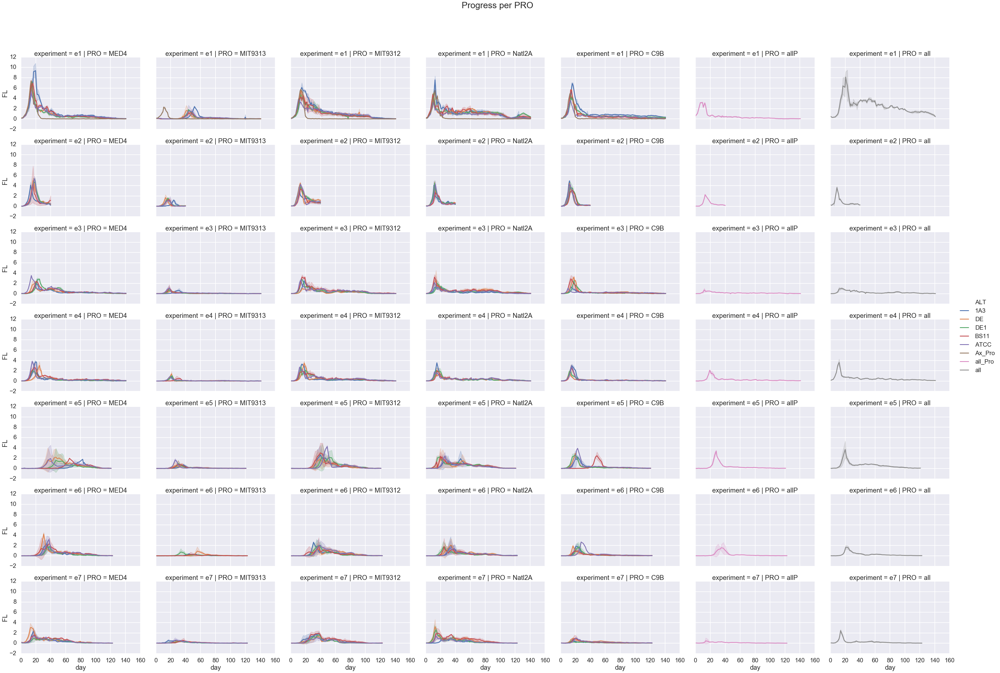

In [22]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO", fontsize=32)


Text(0.5,0.98,'Progress per ALT')

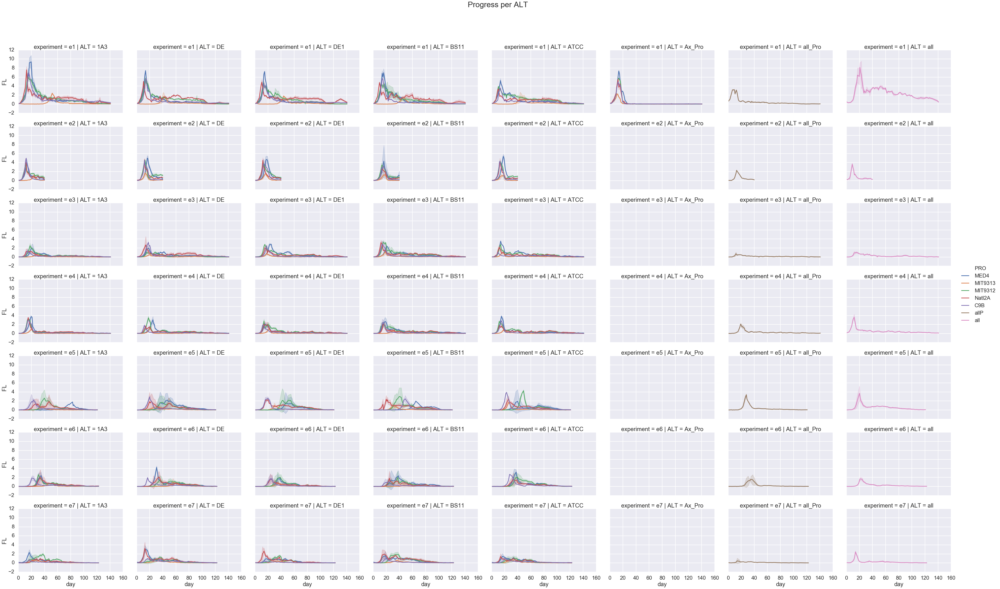

In [7]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', col='ALT', row='experiment',
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT", fontsize=32)


Text(0.5,0.98,'Progress per Experiment')

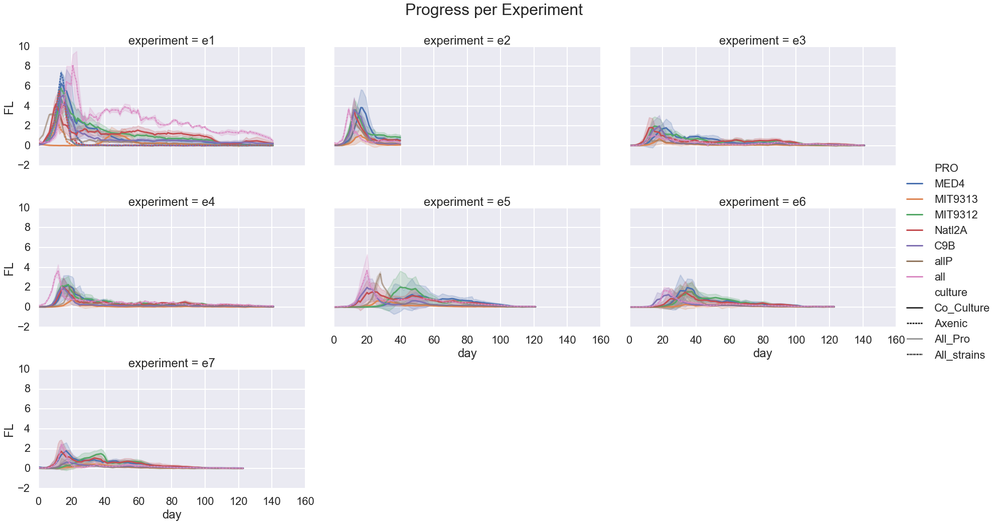

In [8]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', aspect=1.7, style='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Experiment", fontsize=32)


Text(0.5,0.98,'Progress per Culture')

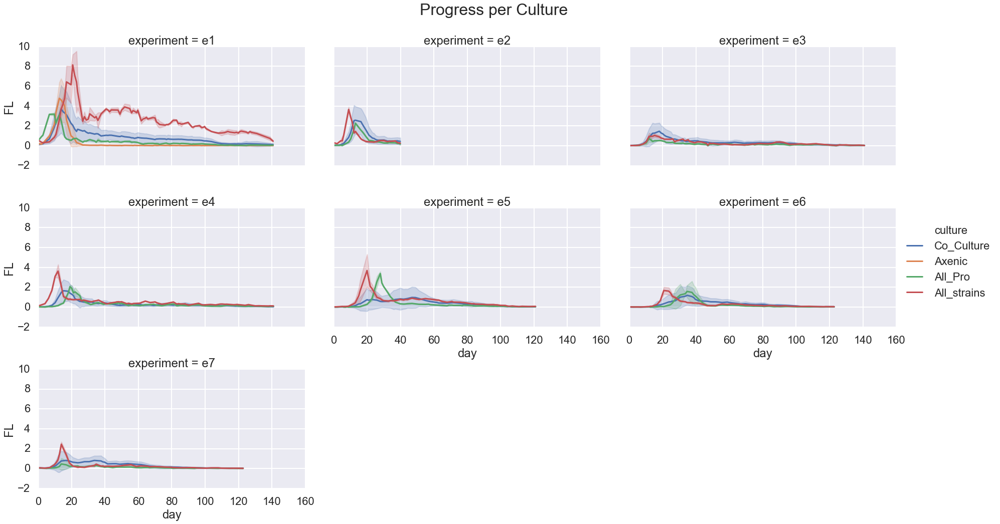

In [9]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture", fontsize=32)


Text(0.5,0.98,'Progress per Experiment (Co-Cultures only)')

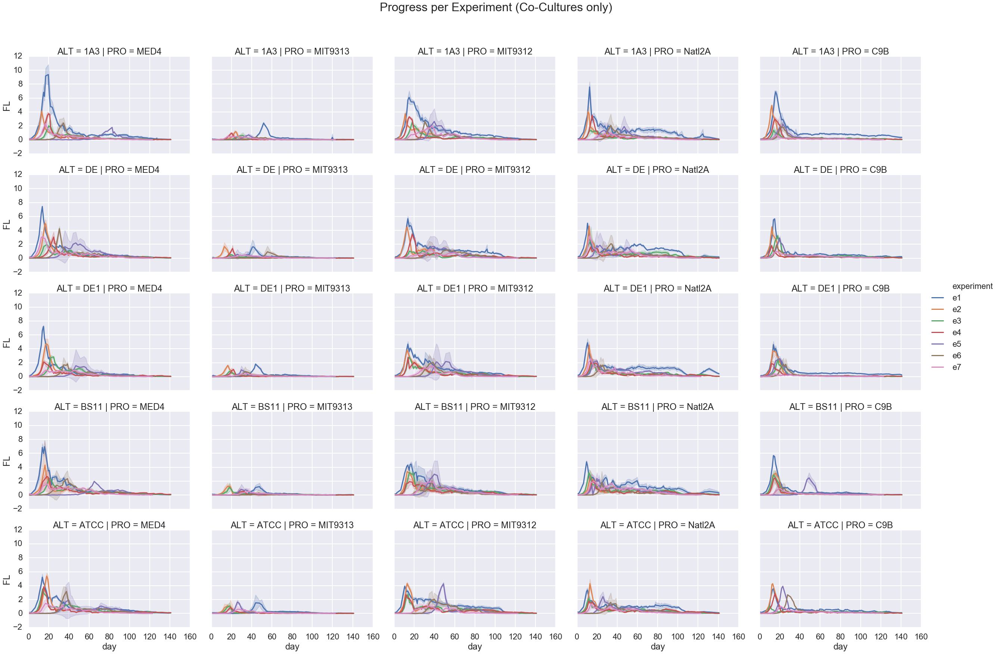

In [14]:
sns.relplot(data=df.loc[df.culture.str.contains("Co_Culture")], x='day', y='FL', kind='line', ci='sd',
            col='PRO', row='ALT', hue='experiment', 
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Experiment (Co-Cultures only)", fontsize=32)


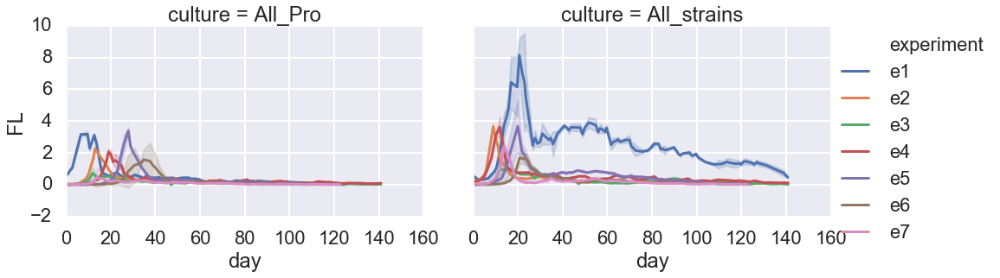

In [15]:
sns.relplot(data=df.loc[~df.culture.str.contains("Co_Culture|Axenic")], x='day', y='FL', kind='line', ci='sd',
            col='culture', #row='culture', 
            hue='experiment', 
           aspect=1.4)
#plt.subplots_adjust(top=0.8)
#plt.suptitle("Progress per Experiment")


# upto 40 days


Text(0.5,0.98,'Progress per Culture, 40 days')

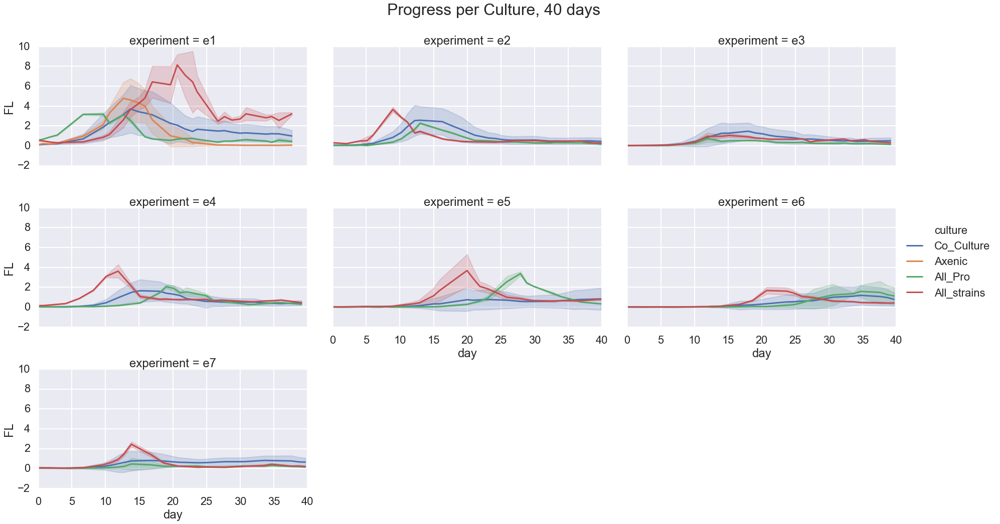

In [21]:
sns.relplot(data=df.loc[df.day < 40], x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture, 40 days", fontsize=32)


# all experiments concatenated

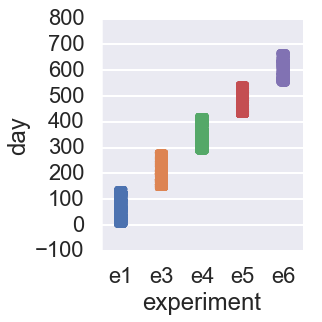

In [42]:
sns.catplot(data=dfcat, x='experiment', y='day')

Text(0.5,0.98,'Progress per PRO, all experiments concatenated')

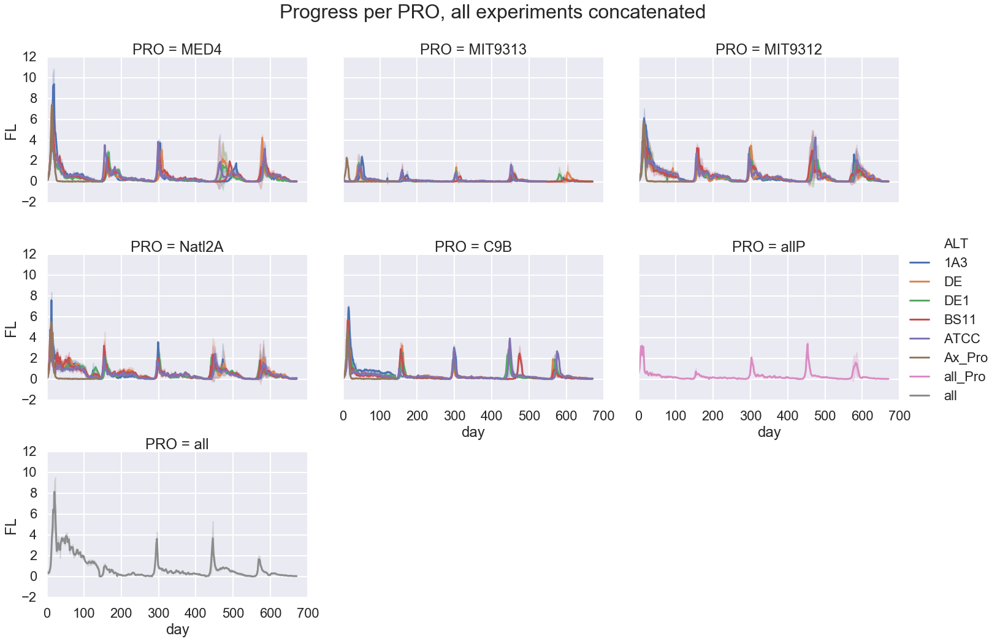

In [43]:
sns.relplot(data=dfcat, x='day', y='FL', kind='line', ci='sd',
            col='PRO', col_wrap=3, hue='ALT', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO, all experiments concatenated", fontsize=32)


In [128]:
X = cp.experiments2X(dfcat, sample_col='sample')
metadf = cp.get_meta(dfcat, meta_col=['sample', 'PRO', 'ALT', 'culture'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='sample')


Variance percent explained
 [0.91445852 0.05312978]


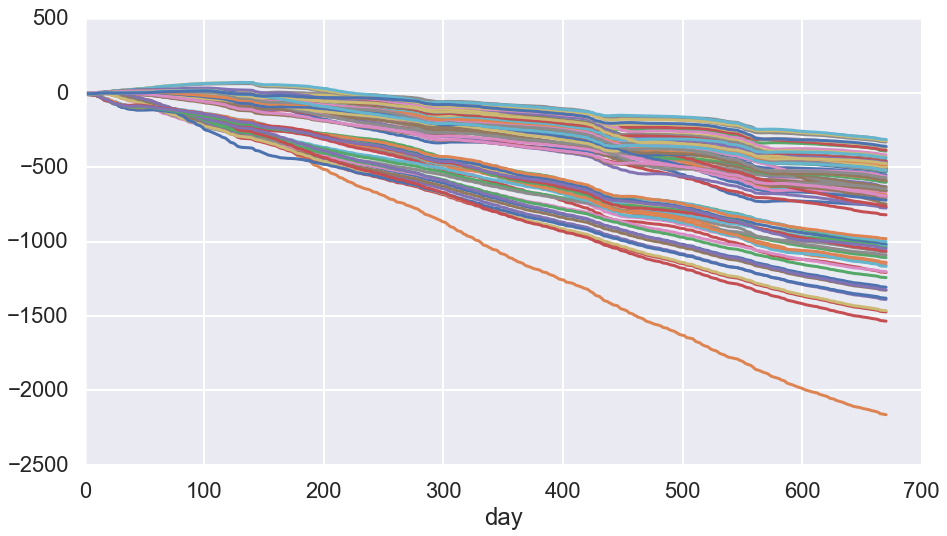

In [129]:
X.T.plot(legend=False)

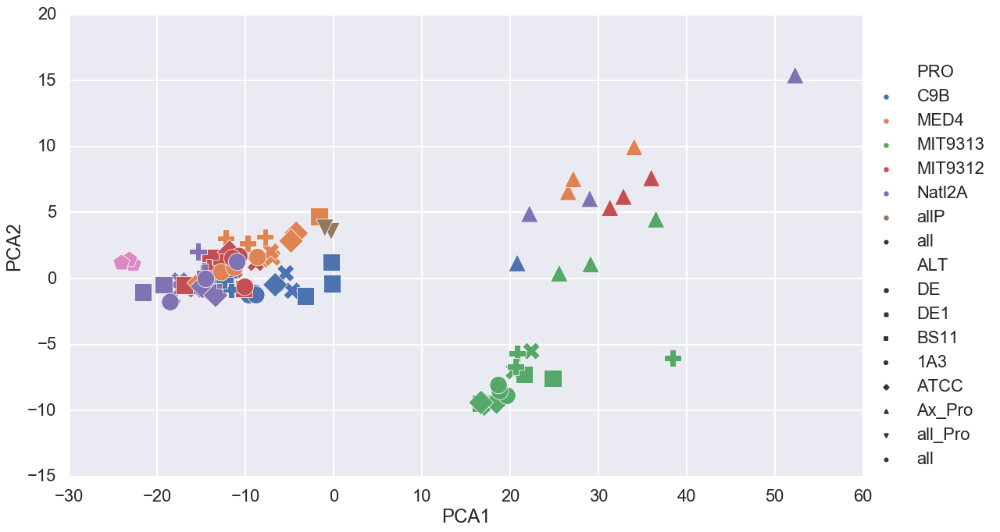

In [121]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='ALT',s=500,
    height=10, aspect=1.6)

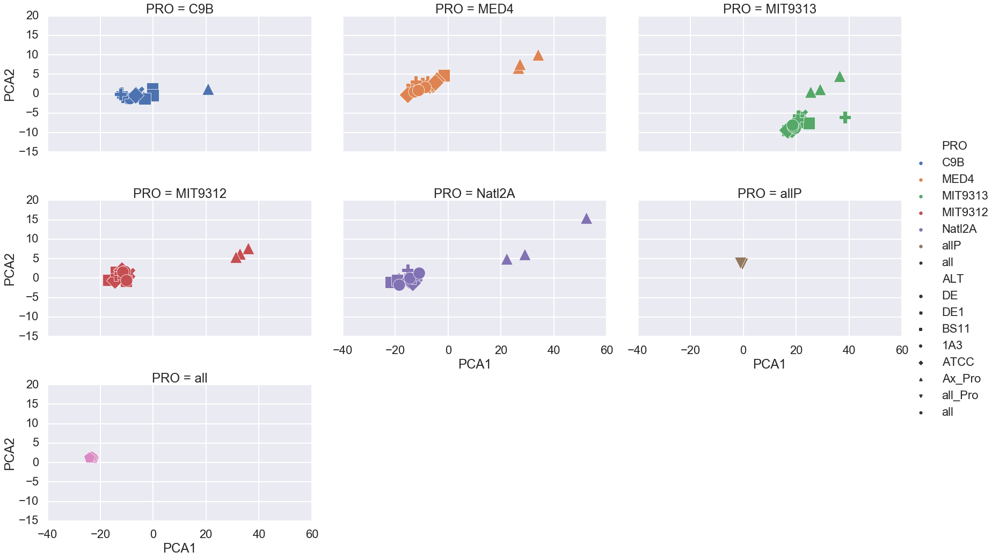

In [123]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='ALT',s=500,
    height=5, aspect=1.6, col='PRO', col_wrap=3)

In [132]:
X = cp.experiments2X(dfcat, sample_col='sample')
metadf = cp.get_meta(dfcat, meta_col=['sample', 'PRO', 'ALT', 'culture'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='sample', n_components=3)


Variance percent explained
 [0.91445852 0.05312978 0.01570129]


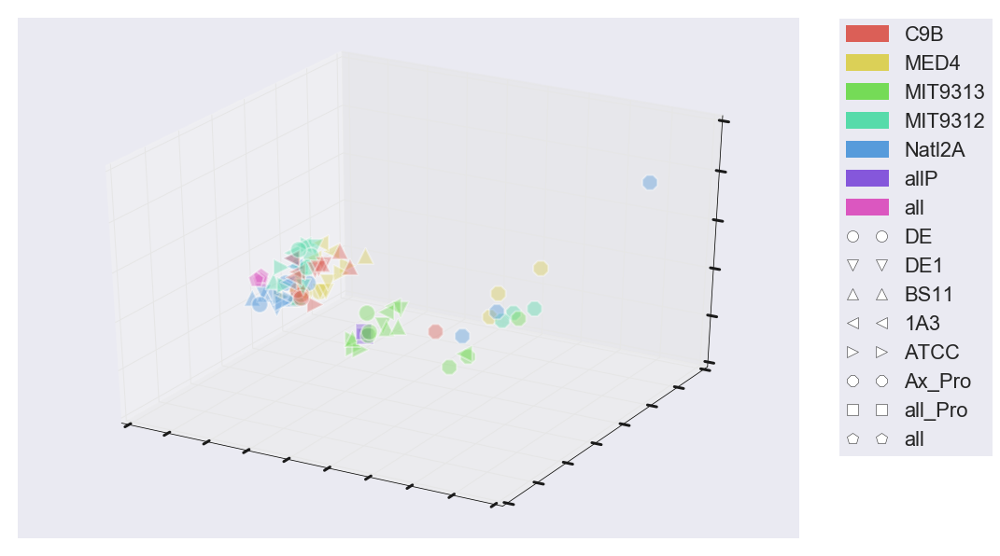

In [142]:
cp.display_pca_3d(dfpca,color_col='PRO', style_col='ALT')
plt.show()

# Z score normalized

In [58]:
from scipy import stats


In [87]:
dfz = df.copy()

In [88]:
from scipy import stats
def norm_zscore(d, experiment, sample):
    d.loc[(d.experiment == experiment) & 
          (d['sample'] == sample), 'FL'] = stats.zscore(
              d.loc[(d.experiment == experiment) &
                    (d['sample'] == sample), 'FL'])
    return d
for e in dfz.experiment.unique():
    for s in dfz['sample'].unique():
        dfz = norm_zscore(dfz, e, s)


C:\Users\wosnat\Anaconda3\lib\site-packages\scipy\stats\stats.py:2241: RuntimeWarning: Mean of empty slice.
  mns = a.mean(axis=axis)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5,0.98,'Progress per Culture, zscore')

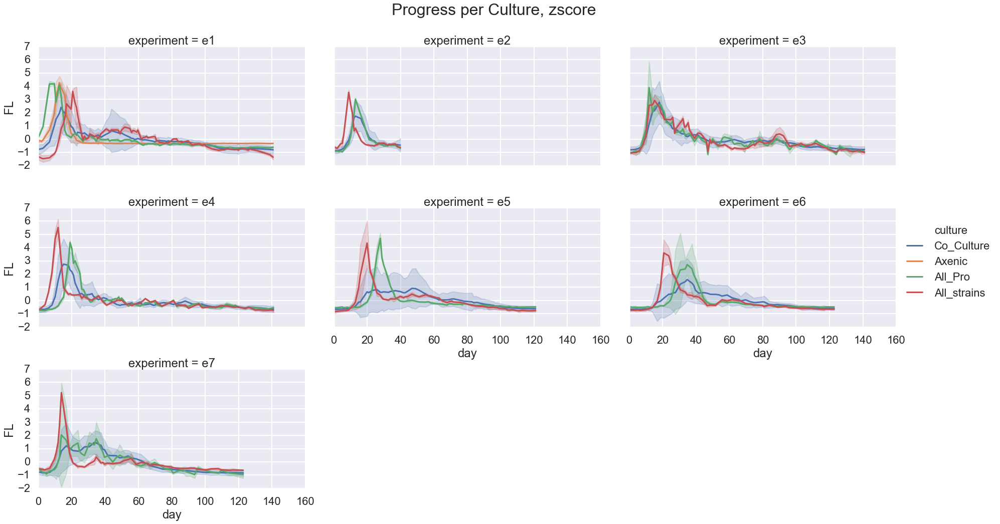

In [92]:
sns.relplot(data=dfz, x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture, zscore", fontsize=32)


# Features from Curves

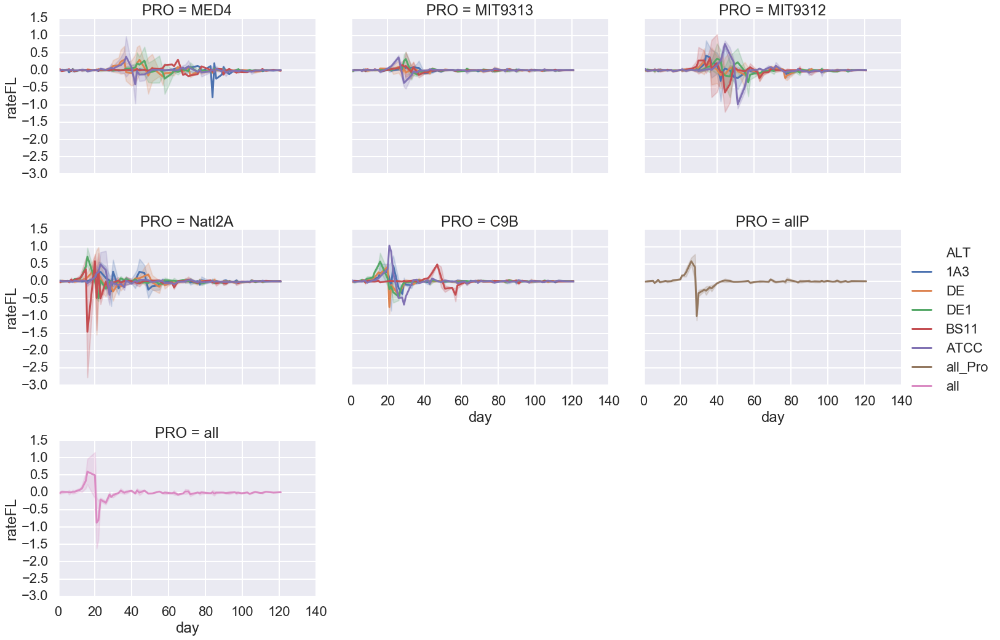

In [15]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='rateFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

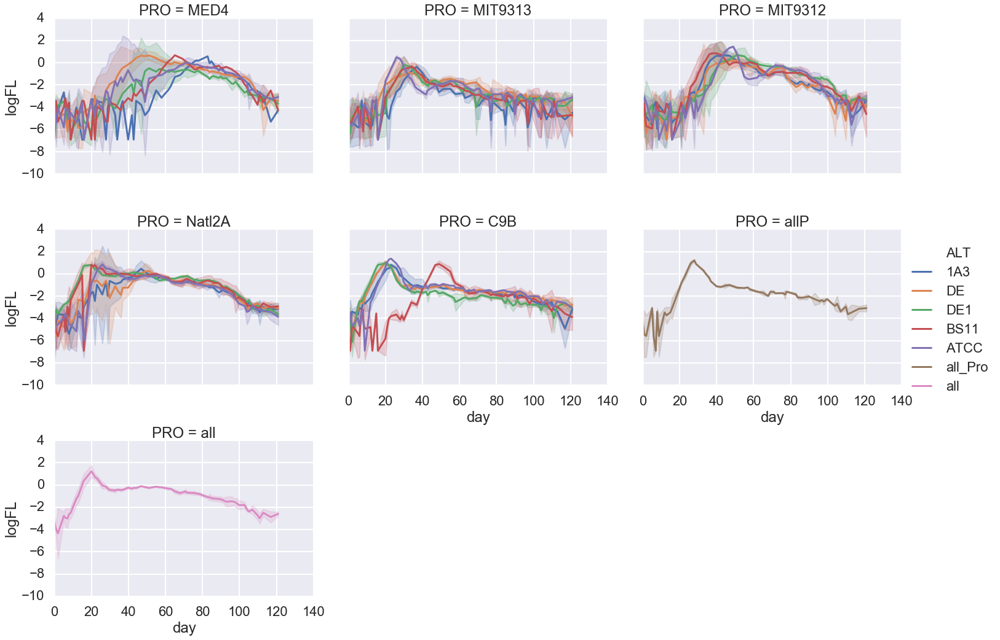

In [16]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='logFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

Compute the following features based on a growth curve:

1. lag phase: time until the first growth
   - lag phase end time
   - lag phase max value
   (startThreashold = Application.WorksheetFunction.Max(yvalues) + 4 * (Application.WorksheetFunction.StDev(yvalues)))
2. growth phase: growth till max value
   - growth max value
   - growth diff (growth max value - lag phase max value)
   - growth end time
   - growth time (growth end time - lag phase end time
   - growth rate (growth diff / growth time)
   
3. stationary phase
   -


4. decline phase
   - decline time - total time to get to 0.5
   - half yield - time to get to 1/2 growth max value
       (halfDeclineTime = (halfYield - beforeHalf + (declinePointsSlope * beforeHalfTime)) / declinePointsSlope)
       (halfLife = halfDeclineTime - maxTime)
   - tenth yield - time to get to 1/10 growth max value
   - decline rate
   - number of spikes
   

5. global params
  - AUC - area under the curve

In [29]:
d = df.loc[(df.experiment == 'e5') & (df['sample'] == '37C')]
t = cp.analyze_curve(d)

with pd.option_context('display.max_rows', -1):
    print(t)


                                2.919
max                           1.07124
max_log                         15.87
max_day                         0.014
min                           -4.2687
min_log                            e5
experiment                        37C
sample                            all
PRO                               all
ALT                       All_strains
culture                         14.99
growth_half_day                 2.024
growth_half_val                   8.8
growth_log_half_day          -1.94491
growth_log_half_val               8.8
growth_tenth_day                0.143
growth_tenth_val                 0.88
growth_log_tenth_day          -4.2687
growth_log_tenth_val          -3.8682
growth_log_intercept         0.283315
growth_log_coefficient       0.909423
growth_log_score_r2           7.62855
growth_auc                   -26.3016
growth_logauc                   2.905
growth_diff                   5.33994
growth_diff_log              0.583333
growth_mean 

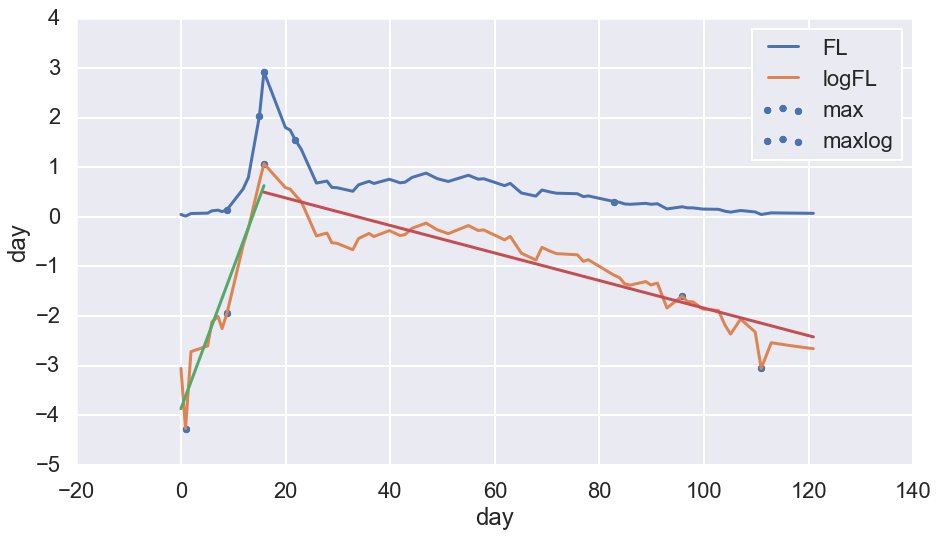

In [7]:
cp.display_features(d, cp.analyze_curve(d))

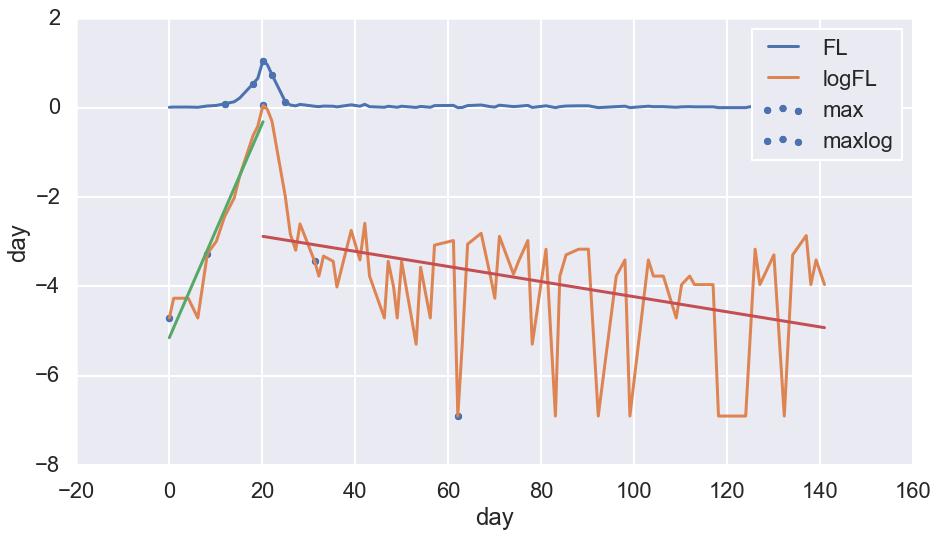

In [66]:
d = df.loc[(df.experiment == 'e4') & (df['sample'] == '2A')]
cp.display_features(d, cp.analyze_curve(d))


In [65]:
np.log(0.1)

-2.3025850929940455

In [63]:
d

,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
2607,0.00,e3,12B,0.014,MIT9313,DE1,Co_Culture,-4.268698,0.014,-4.268698,-0.584227,NaN,NaN,NaN,NaN,NaN,"e3, 12B"
2608,0.99,e3,12B,0.014,MIT9313,DE1,Co_Culture,-4.268698,0.028,-8.537396,-0.584227,0.000,0.000000,0.99,0.000000,0.000000,"e3, 12B"
2609,4.11,e3,12B,0.050,MIT9313,DE1,Co_Culture,-2.995732,0.078,-11.533128,-0.278684,0.036,1.272966,3.12,0.011538,0.408002,"e3, 12B"
2610,6.17,e3,12B,0.018,MIT9313,DE1,Co_Culture,-4.017384,0.096,-15.550512,-0.550278,-0.032,-1.021651,2.06,-0.015534,-0.495947,"e3, 12B"
2611,8.25,e3,12B,0.082,MIT9313,DE1,Co_Culture,-2.501036,0.178,-18.051548,-0.007091,0.064,1.516347,2.08,0.030769,0.729013,"e3, 12B"
2612,10.13,e3,12B,0.109,MIT9313,DE1,Co_Culture,-2.216407,0.287,-20.267955,0.222066,0.027,0.284629,1.88,0.014362,0.151398,"e3, 12B"
2613,11.91,e3,12B,0.144,MIT9313,DE1,Co_Culture,-1.937942,0.431,-22.205897,0.519122,0.035,0.278465,1.78,0.019663,0.156441,"e3, 12B"
2614,14.00,e3,12B,0.214,MIT9313,DE1,Co_Culture,-1.541779,0.645,-23.747676,1.113233,0.070,0.396163,2.09,0.033493,0.189552,"e3, 12B"
2615,15.21,e3,12B,0.339,MIT9313,DE1,Co_Culture,-1.081755,0.984,-24.829432,2.174145,0.125,0.460024,1.21,0.103306,0.380185,"e3, 12B"
2616,18.04,e3,12B,0.761,MIT9313,DE1,Co_Culture,-0.273122,1.745,-25.102553,5.755785,0.422,0.808633,2.83,0.149117,0.285736,"e3, 12B"


In [8]:
g = cp.generate_features(df)

In [49]:
g.columns

Index(['max', 'max_log', 'max_day', 'min', 'min_log', 'experiment', 'sample',
       'PRO', 'ALT', 'culture', 'growth_half_day', 'growth_half_val',
       'growth_log_half_day', 'growth_log_half_val', 'growth_tenth_day',
       'growth_tenth_val', 'growth_log_tenth_day', 'growth_log_tenth_val',
       'growth_log_intercept', 'growth_log_coefficient', 'growth_log_score_r2',
       'growth_auc', 'growth_logauc', 'growth_diff', 'growth_diff_log',
       'growth_mean', 'growth_std', 'growth_min', 'growth_max',
       'growth_mean_log', 'growth_std_log', 'growth_min_log', 'growth_max_log',
       'growth_mean_rate', 'growth_std_rate', 'growth_min_rate',
       'growth_max_rate', 'growth_mean_log_rate', 'growth_std_log_rate',
       'growth_min_log_rate', 'growth_max_log_rate', 'decay_half_day',
       'decay_half_val', 'decay_log_half_day', 'decay_log_half_val',
       'decay_tenth_day', 'decay_tenth_val', 'decay_log_tenth_day',
       'decay_log_tenth_val', 'decay_log_intercept', 'decay_lo

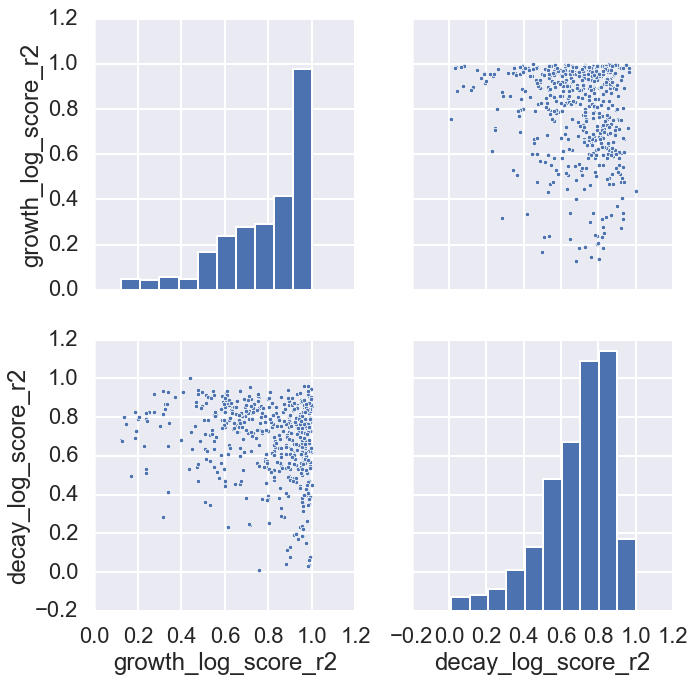

In [69]:
#sns.pairplot(data=g.loc[[]], x='growth_log_score_r2' ,y='decay_log_score_r2')
sns.pairplot(data=g.loc[g.max_day > -1,['growth_log_score_r2' ,'decay_log_score_r2']], height=5)

In [61]:
g.loc[g['decay_log_score_r2'] <0.3,['experiment', 'PRO', 'ALT','growth_log_score_r2' ,'decay_log_score_r2']]

,experiment,PRO,ALT,growth_log_score_r2,decay_log_score_r2
experiment_sample,,,,,
"e1, 26C",e1,C9B,Ax_Pro,0.873123,0.284912
"e1, 28B",e1,MIT9312,Ax_Pro,0.975108,0.262210
"e1, 28C",e1,MIT9312,Ax_Pro,0.946660,0.233129
"e1, 29A",e1,MIT9313,Ax_Pro,0.988964,0.077510
"e1, 29B",e1,MIT9313,Ax_Pro,0.973590,0.148313
"e1, 29C",e1,MIT9313,Ax_Pro,0.953203,0.238155
"e2, 23A",e2,MIT9312,ATCC,0.896755,0.128148
"e2, 23B",e2,MIT9312,ATCC,0.957582,0.186976
"e2, 23C",e2,MIT9312,ATCC,0.956625,0.220432


In [191]:
meta_cols = ['sample', 'experiment','PRO', 'ALT', 'culture', 'experiment_sample']
feature_cols = g.columns.difference(meta_cols)

In [192]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample')

Variance percent explained
 [0.43710945 0.13341592]


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


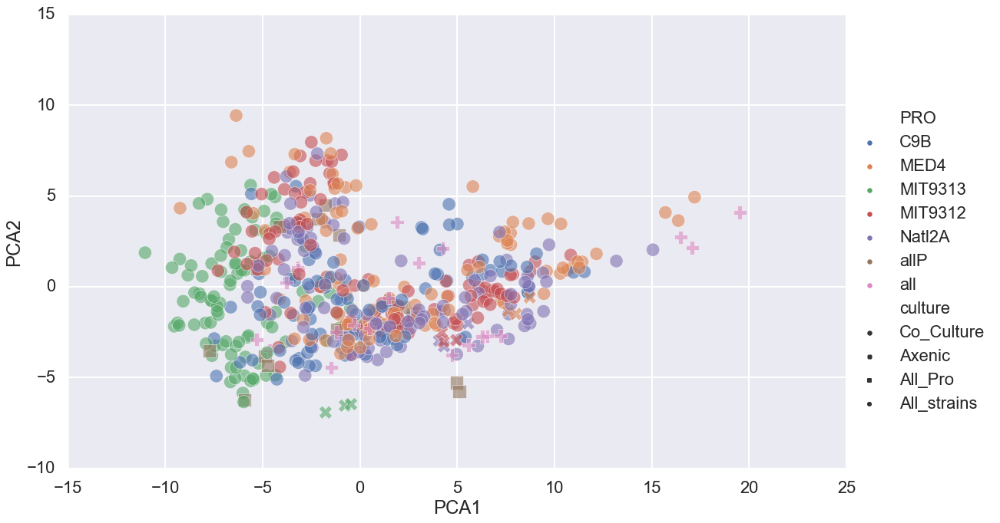

In [193]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, alpha=0.6, height=10, aspect=1.6)

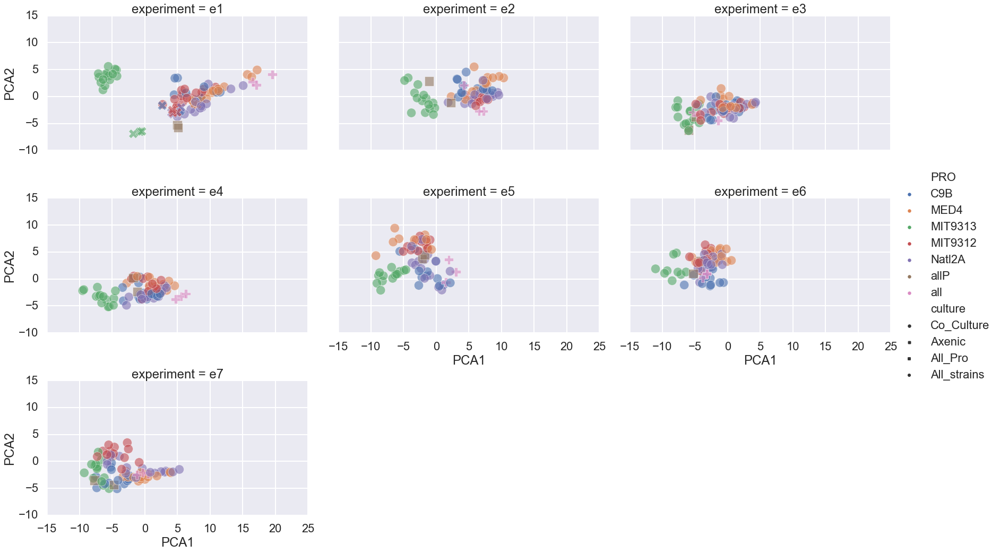

In [194]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, alpha=0.6,
            col='experiment', col_wrap=3, height=5, aspect=1.6)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [305]:
X = cp.features2X(g)
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col='experiment_sample', n_components=3)


Variance percent explained
 [0.43710945 0.13341592 0.08961728]


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


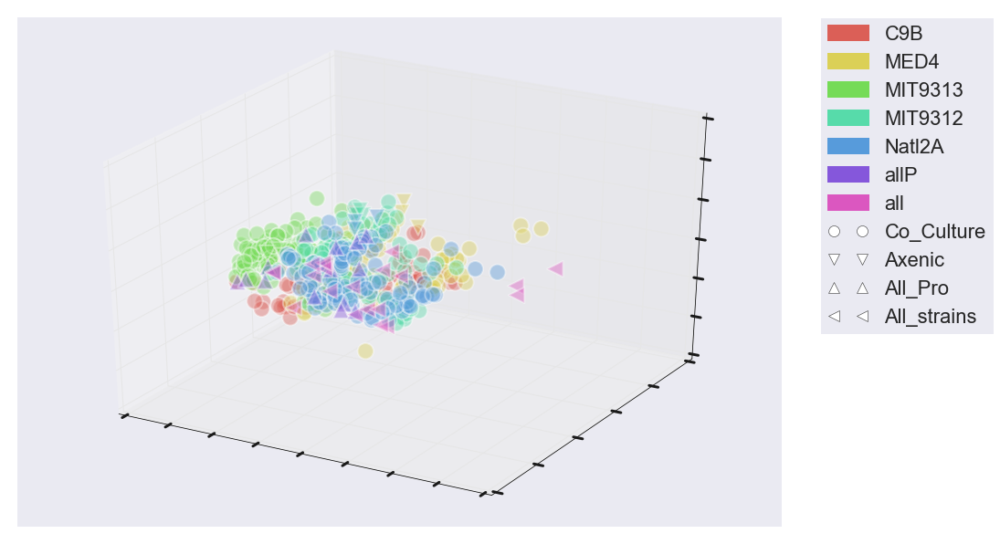

In [196]:
cp.display_pca_3d(dfpca, color_col='PRO', style_col='culture')

plt.show()

In [323]:
X = cp.features2X(g)
y = g['PRO']
metadf = cp.get_meta(g, meta_col=['experiment_sample', 'experiment','sample', 'PRO', 'ALT', 'culture'], 
                     value_col='max')
clf = cp.forest_classifier(X=X, y=y)

0.5663551401869159


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


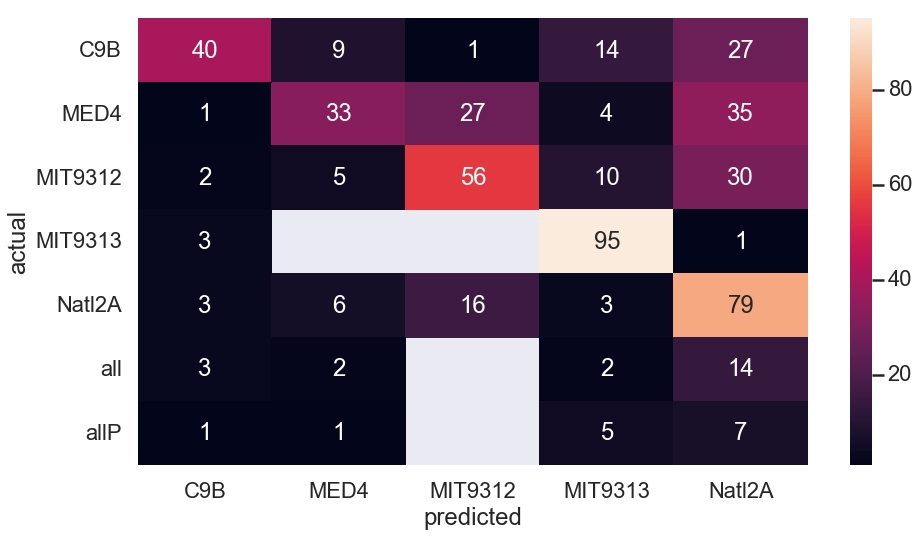

In [326]:
cp.forest_heatmap(clf=clf, X=X, y=y)

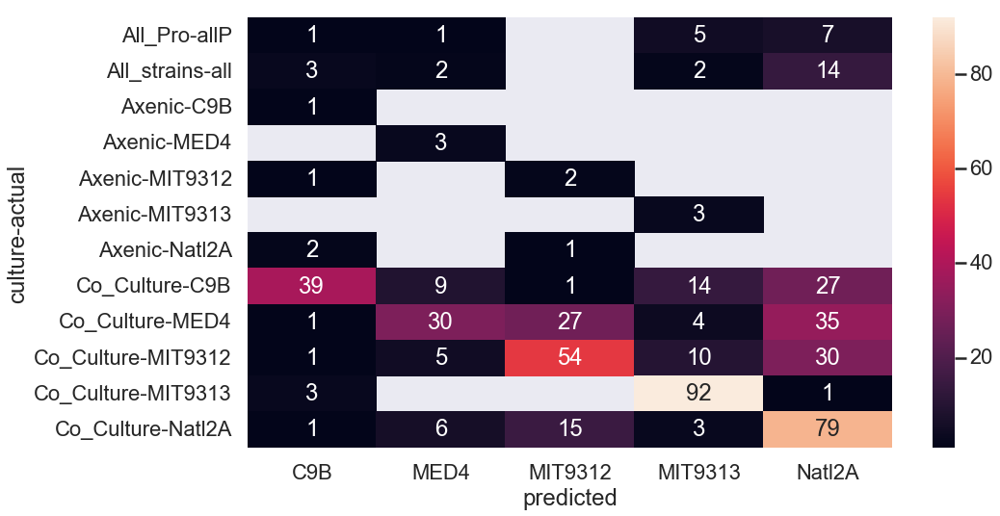

In [327]:
m= metadf.set_index(keys='experiment_sample')
cp.forest_heatmap(clf=clf, X=X, y=y, metadf=m, breakdown='culture')

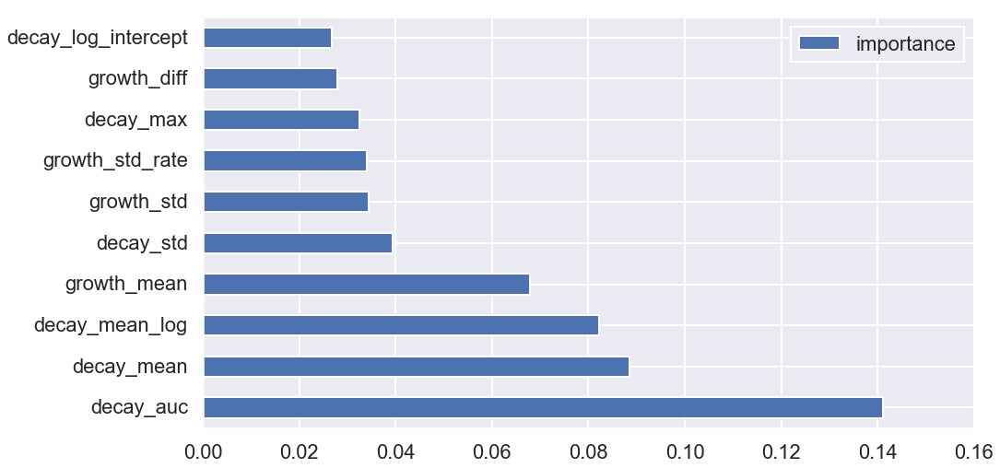

In [234]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [235]:
g2 = g.loc[(g.experiment == 'e1') | 
               (g.experiment == 'e3') |
               (g.experiment == 'e4') |
               (g.experiment == 'e5') |
               (g.experiment == 'e6') 
              ]

In [236]:
X = cp.features2X(g2)
y = g2['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5958005249343832


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


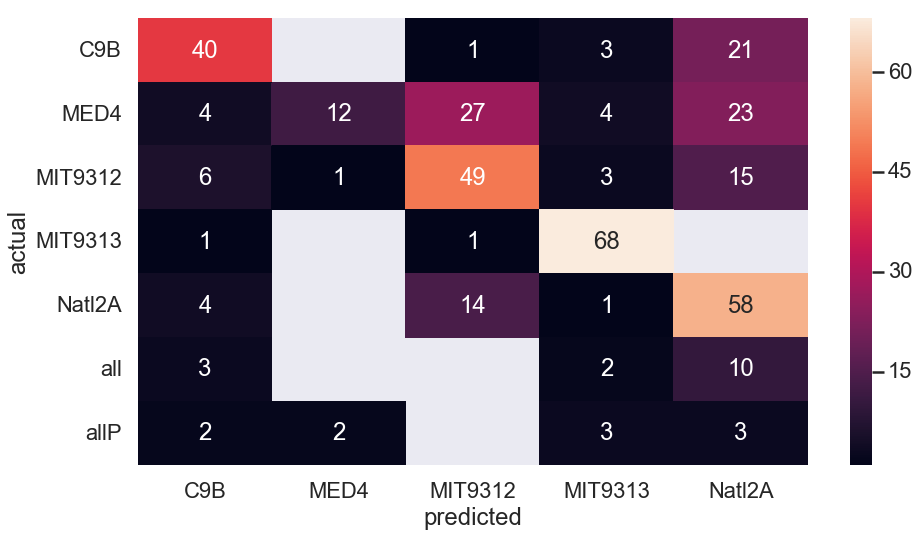

In [237]:
cp.forest_heatmap(clf=clf, X=X, y=y)

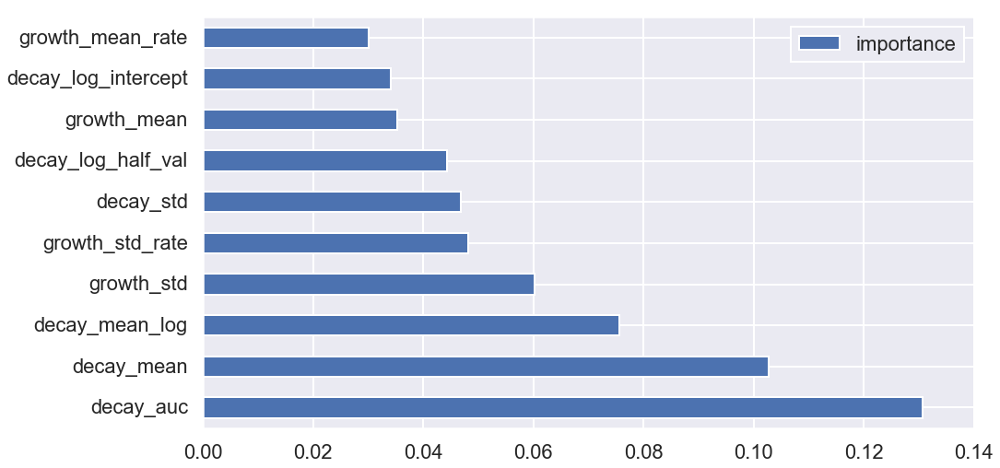

In [238]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [242]:
X = cp.features2X(g2)
y = g2['ALT']
clf = cp.forest_classifier(X=X, y=y)

0.3910761154855643


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


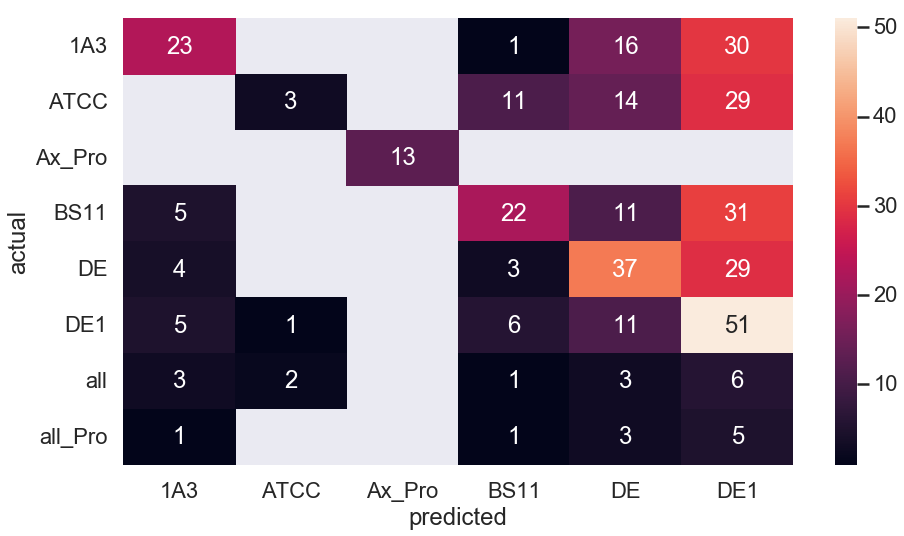

In [244]:
cp.forest_heatmap(clf=clf, X=X, y=y)

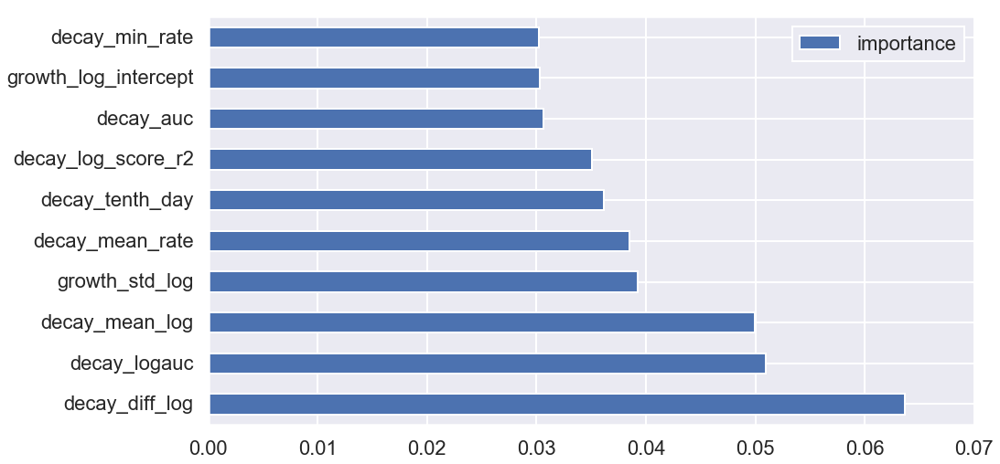

In [245]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Comparison of all Experiments

In [195]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = df.pivot(index='experiment_sample', columns='day', values='logFL')
# X.fillna(method='pad', inplace=True)
# scaledX = StandardScaler().fit_transform(X)
# pca = PCA(n_components=2)
# principalComponents = pca.fit_transform(scaledX)
# print('Variance percent explained\n', pca.explained_variance_ratio_)
# principalDf = pd.DataFrame(data = principalComponents
#              , columns = ['PCA1', 'PCA2'])
# principalDf.set_index(X.index, inplace=True)
# meta = meta_dfs[0]
# dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')


In [248]:
X = cp.experiments2X(df, sample_col='experiment_sample')
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.86851513 0.08358386]


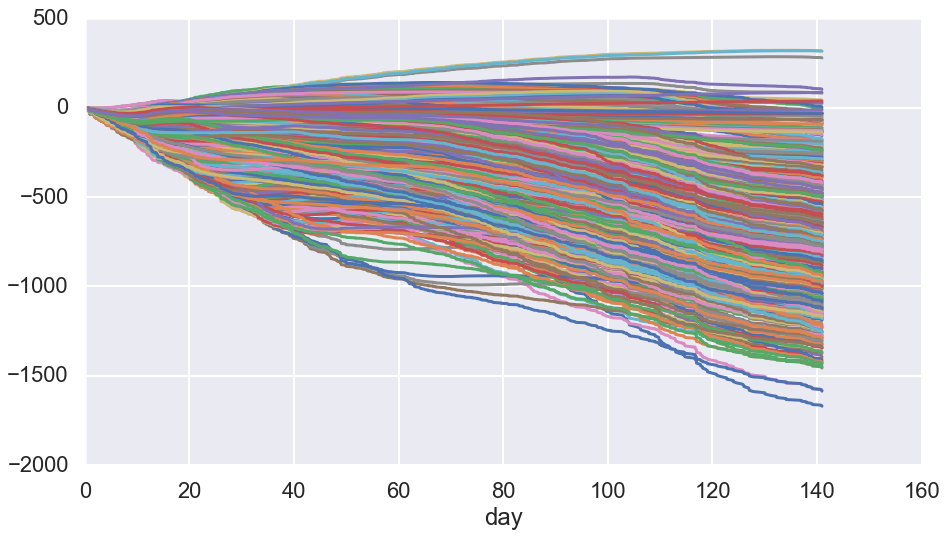

In [251]:
X.T.plot(legend=False)

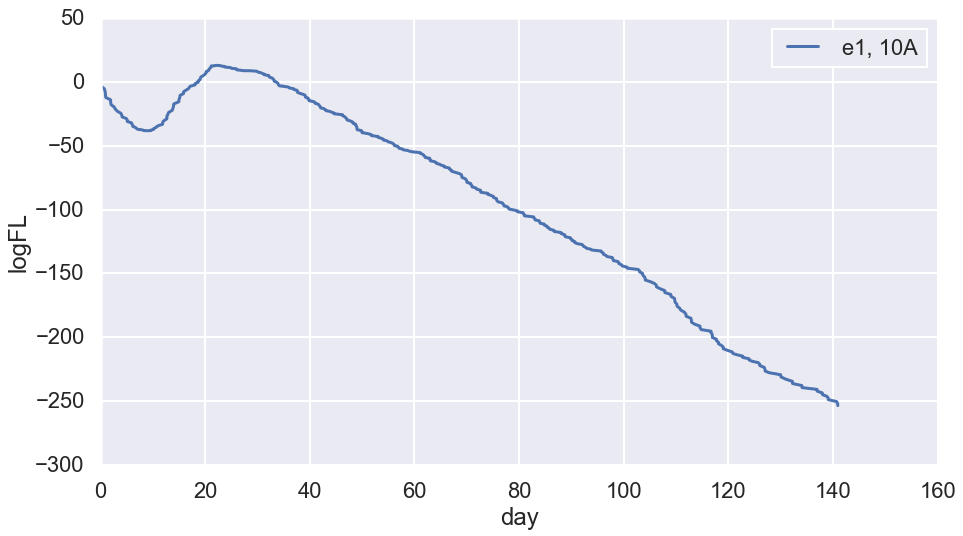

In [255]:
n = 'e1, 10A'
plt.plot(X.T[n])
d= df.loc[(df.experiment_sample == 'n')]
#d['cumsumlogFL'] = d.logFL.transform(pd.Series.cumsum)
sns.lineplot(data=d,x='day', y='logFL')


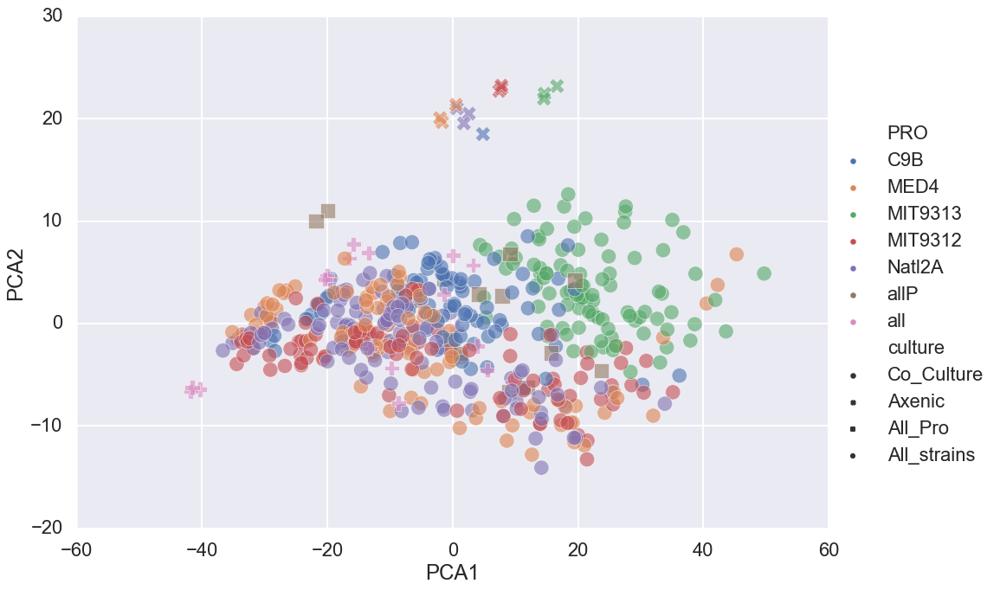

In [258]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300,alpha=0.6,
             height=10, aspect=1.4)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

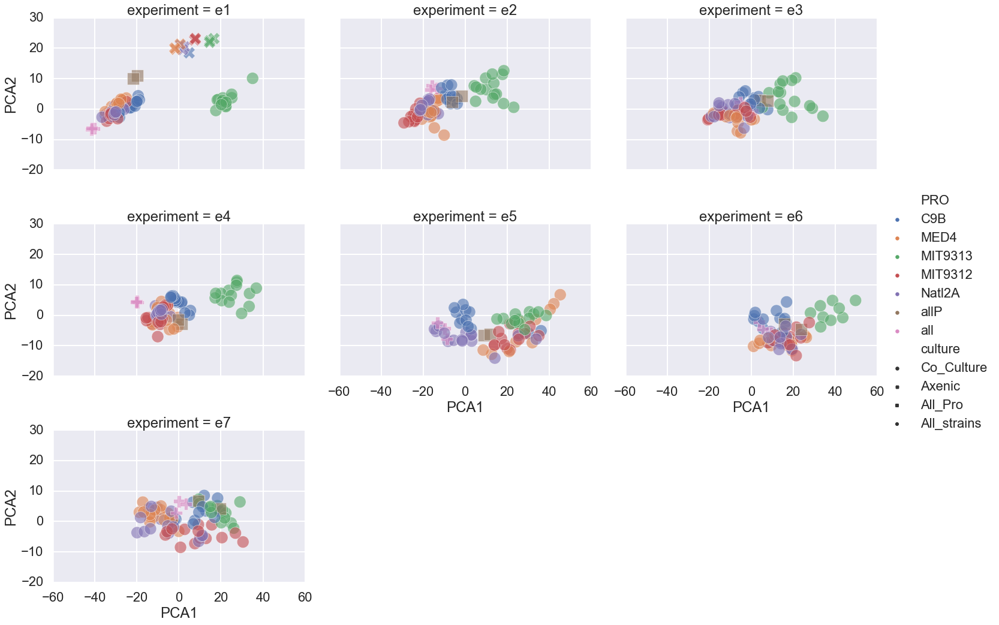

In [260]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=400, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

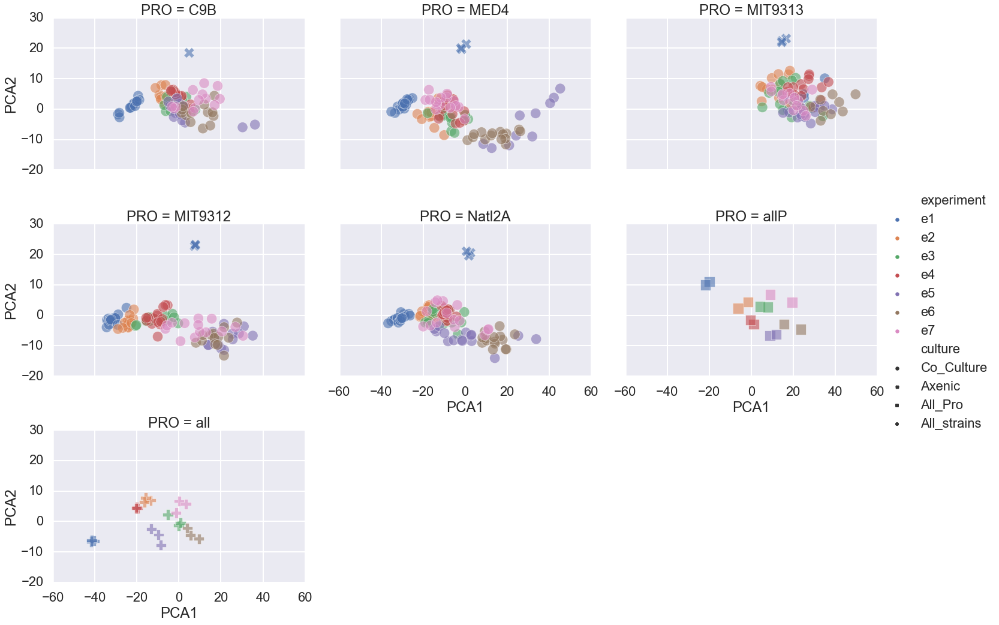

In [261]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300, alpha=0.6,
            col='PRO', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

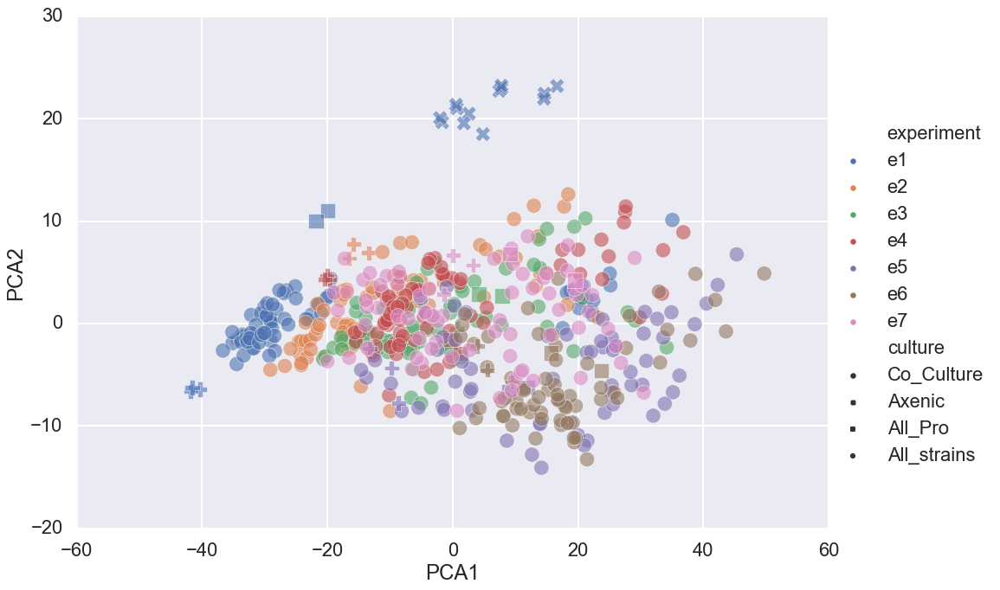

In [263]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=300,  
            aspect=1.4, height=10, alpha=0.6,
           # col='PRO', aspect=1.4, col_wrap=3
           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

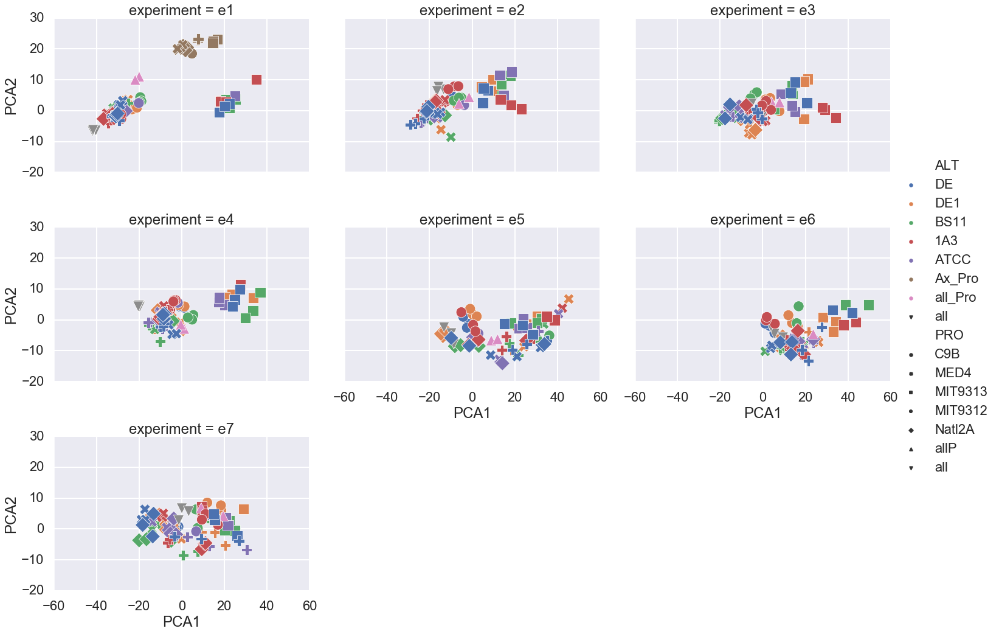

In [265]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='PRO',s=300, height=5,
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [276]:
X = cp.experiments2X(df)
metadf = cp.get_meta(df)
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4392523364485981


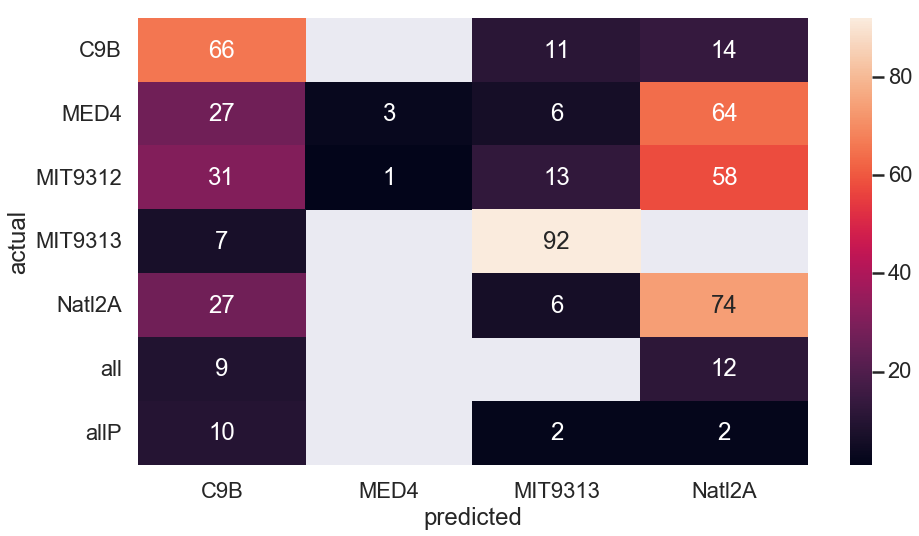

In [277]:
cp.forest_heatmap(clf=clf, X=X, y=y)

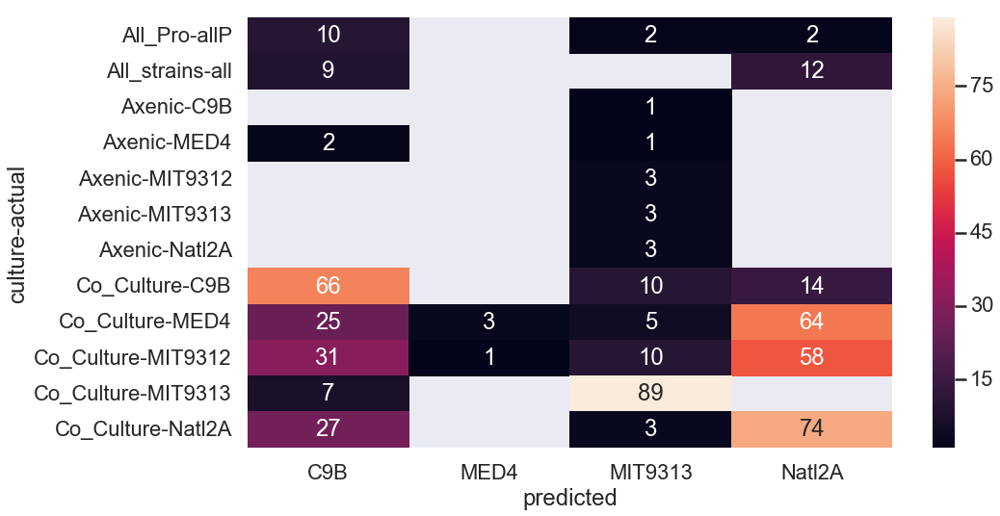

In [301]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

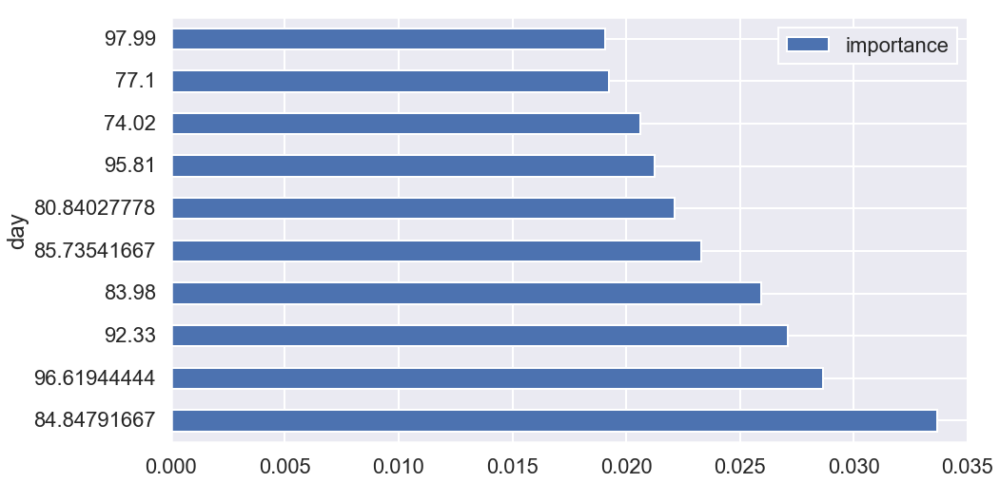

In [278]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

# Decay Curve

In [328]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,-2.017406,0.133,-2.017406,-0.588733,NaN,NaN,NaN,NaN,NaN,"e1, 1A"
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,-1.838851,0.292,-3.856257,-0.575763,0.026,0.178555,0.715972,0.036314,0.249388,"e1, 1A"
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,-1.864330,0.447,-5.720587,-0.577758,-0.004,-0.025479,1.209722,-0.003307,-0.021062,"e1, 1A"
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,-1.714798,0.627,-7.435386,-0.565287,0.025,0.149532,0.905556,0.027607,0.165127,"e1, 1A"
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,-0.458866,1.259,-7.894252,-0.339798,0.452,1.255933,3.843056,0.117615,0.326806,"e1, 1A"


In [334]:
y_col = 'FL'
x_col = 'day'
d = df.groupby('experiment_sample').get_group('e1, 11B').reset_index()
d


,index,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,2728,0.000000,e1,11B,0.183,MED4,DE1,Co_Culture,-1.698269,0.183,-1.698269,-0.488617,NaN,NaN,NaN,NaN,NaN,"e1, 11B"
1,2729,0.715972,e1,11B,0.128,MED4,DE1,Co_Culture,-2.055725,0.311,-3.753994,-0.530519,-0.055,-0.357456,0.715972,-0.076819,-0.499259,"e1, 11B"
2,2730,1.925694,e1,11B,0.182,MED4,DE1,Co_Culture,-1.703749,0.493,-5.457743,-0.489378,0.054,0.351976,1.209722,0.044638,0.290956,"e1, 11B"
3,2731,2.831250,e1,11B,0.244,MED4,DE1,Co_Culture,-1.410587,0.737,-6.868330,-0.442144,0.062,0.293162,0.905556,0.068466,0.323737,"e1, 11B"
4,2732,6.674306,e1,11B,0.774,MED4,DE1,Co_Culture,-0.256183,1.511,-7.124513,-0.038361,0.530,1.154404,3.843056,0.137911,0.300387,"e1, 11B"
5,2733,9.642361,e1,11B,1.625,MED4,DE1,Co_Culture,0.485508,3.136,-6.639005,0.609976,0.851,0.741691,2.968056,0.286720,0.249891,"e1, 11B"
6,2734,10.603472,e1,11B,2.516,MED4,DE1,Co_Culture,0.922670,5.652,-5.716335,1.288788,0.891,0.437163,0.961111,0.927052,0.454851,"e1, 11B"
7,2735,12.650694,e1,11B,4.076,MED4,DE1,Co_Culture,1.405116,9.728,-4.311219,2.477280,1.560,0.482446,2.047222,0.762008,0.235659,"e1, 11B"
8,2736,13.694444,e1,11B,6.113,MED4,DE1,Co_Culture,1.810418,15.841,-2.500801,4.029176,2.037,0.405302,1.043750,1.951617,0.388313,"e1, 11B"
9,2737,14.960417,e1,11B,7.116,MED4,DE1,Co_Culture,1.962346,22.957,-0.538456,4.793315,1.003,0.151928,1.265972,0.792276,0.120009,"e1, 11B"


In [335]:
y_col = 'FL'
x_col = 'day'
maxidx = d[y_col].idxmax()
maxday = d.loc[maxidx][x_col]
print(maxidx, maxday)


9 14.96041667


In [337]:
c = d[maxidx:].reset_index()
c


,level_0,index,day,experiment,sample,FL,PRO,ALT,culture,logFL,cumsumFL,cumsumlogFL,zscoreFL,diffFL,difflogFL,diffday,rateFL,ratelogFL,experiment_sample
0,9,2737,14.960417,e1,11B,7.116,MED4,DE1,Co_Culture,1.962346,22.957,-0.538456,4.793315,1.003,0.151928,1.265972,0.792276,0.120009,"e1, 11B"
1,10,2738,15.853472,e1,11B,5.600,MED4,DE1,Co_Culture,1.722767,28.557,1.184311,3.638345,-1.516,-0.239579,0.893056,-1.697543,-0.268269,"e1, 11B"
2,11,2739,16.952083,e1,11B,4.928,MED4,DE1,Co_Culture,1.594933,33.485,2.779244,3.126379,-0.672,-0.127833,1.098611,-0.611681,-0.116359,"e1, 11B"
3,12,2740,19.657639,e1,11B,2.476,MED4,DE1,Co_Culture,0.906644,35.961,3.685889,1.258314,-2.452,-0.688289,2.705556,-0.906283,-0.254398,"e1, 11B"
4,13,2741,20.660417,e1,11B,2.555,MED4,DE1,Co_Culture,0.938052,38.516,4.623941,1.318500,0.079,0.031408,1.002778,0.078781,0.031321,"e1, 11B"
5,14,2742,21.843056,e1,11B,1.421,MED4,DE1,Co_Culture,0.351361,39.937,4.975302,0.454558,-1.134,-0.586691,1.182639,-0.958873,-0.496087,"e1, 11B"
6,15,2743,22.951389,e1,11B,1.624,MED4,DE1,Co_Culture,0.484892,41.561,5.460194,0.609215,0.203,0.133531,1.108333,0.183158,0.120479,"e1, 11B"
7,16,2744,23.623611,e1,11B,1.696,MED4,DE1,Co_Culture,0.528273,43.257,5.988467,0.664068,0.072,0.043380,0.672222,0.107107,0.064533,"e1, 11B"
8,17,2745,26.702083,e1,11B,1.587,MED4,DE1,Co_Culture,0.461845,44.844,6.450312,0.581026,-0.109,-0.066427,3.078472,-0.035407,-0.021578,"e1, 11B"
9,18,2746,27.672222,e1,11B,1.604,MED4,DE1,Co_Culture,0.472501,46.448,6.922812,0.593978,0.017,0.010655,0.970139,0.017523,0.010983,"e1, 11B"


In [339]:
r = pd.DataFrame()
r[x_col] = c[x_col] - c[x_col].min()
r[y_col] = c[y_col] / c[y_col].max()
r

,day,FL
0,0.000000,1.000000
1,0.893056,0.786959
2,1.991667,0.692524
3,4.697222,0.347948
4,5.700000,0.359050
5,6.882639,0.199691
6,7.990972,0.228218
7,8.663194,0.238336
8,11.741667,0.223019
9,12.711806,0.225408


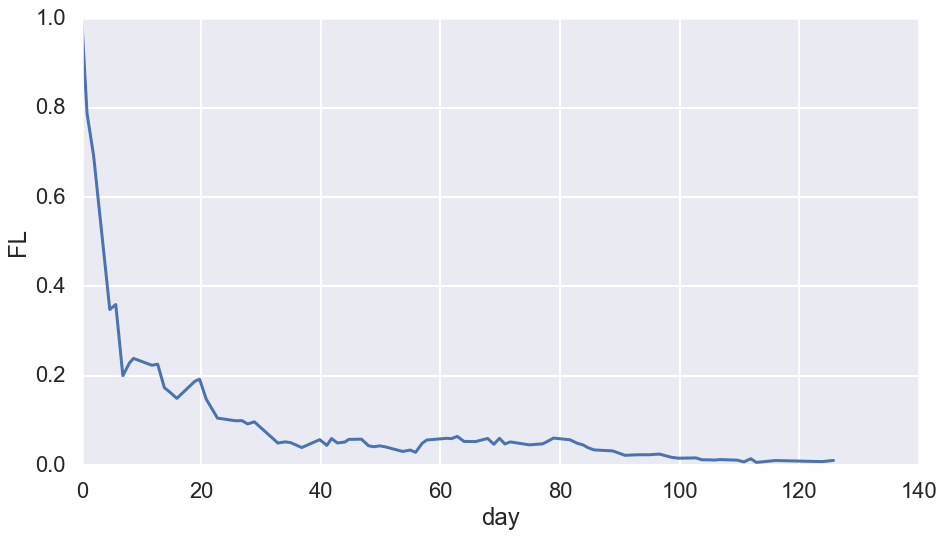

In [341]:
sns.lineplot(data=r, x=x_col, y=y_col)

In [352]:
def extract_decay(d, y_col = 'FL', x_col = 'day'):
    d = d.reset_index()
    maxidx = d[y_col].idxmax()
    c = d[maxidx:].reset_index()
    r = pd.DataFrame()
    r[x_col] = c[x_col] - c[x_col].min()
    r[y_col] = c[y_col] / c[y_col].max()
    meta_cols = ['experiment', 'sample', 'PRO', 'ALT', 'culture']
    for c in meta_cols:
        r[c] = d[c].unique()[0]

    return r

In [353]:
dfd = df.groupby('experiment_sample').apply(extract_decay)
dfd.reset_index(level=0, inplace=True)
dfd

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture
0,"e1, 10A",0.000000,1.000000,e1,10A,C9B,DE,Co_Culture
1,"e1, 10A",0.893056,0.719623,e1,10A,C9B,DE,Co_Culture
2,"e1, 10A",1.991667,0.489059,e1,10A,C9B,DE,Co_Culture
3,"e1, 10A",4.697222,0.520192,e1,10A,C9B,DE,Co_Culture
4,"e1, 10A",5.700000,0.448141,e1,10A,C9B,DE,Co_Culture
5,"e1, 10A",6.882639,0.207970,e1,10A,C9B,DE,Co_Culture
6,"e1, 10A",7.990972,0.146593,e1,10A,C9B,DE,Co_Culture
7,"e1, 10A",8.663194,0.142146,e1,10A,C9B,DE,Co_Culture
8,"e1, 10A",11.741667,0.141968,e1,10A,C9B,DE,Co_Culture
9,"e1, 10A",12.711806,0.175769,e1,10A,C9B,DE,Co_Culture


In [354]:
dfd = cp.update_calculated_fields(dfd, group_col='experiment_sample')


C:\Users\wosnat\Anaconda3\lib\site-packages\scipy\stats\stats.py:2247: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


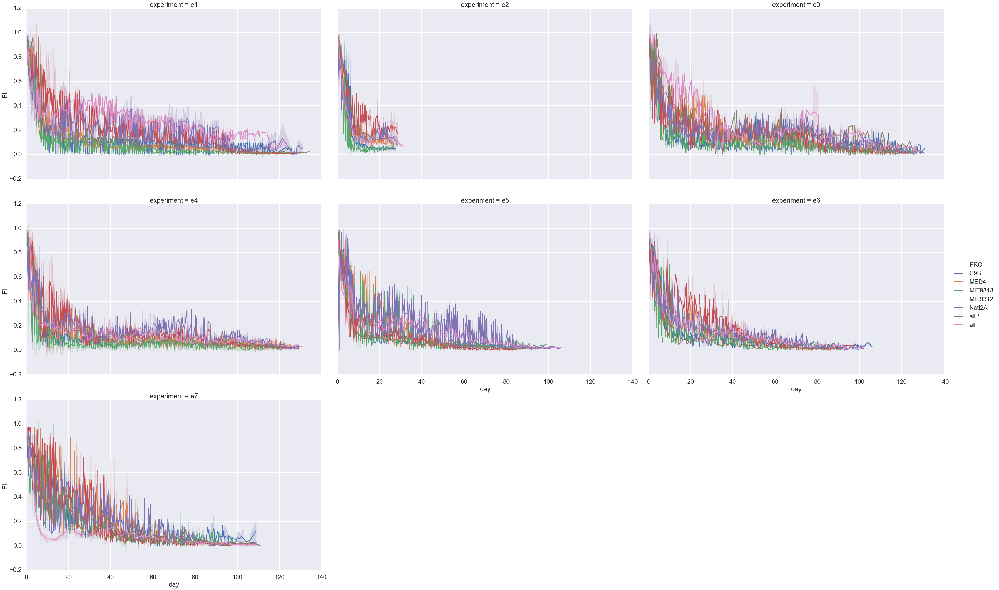

In [363]:
sns.relplot(data=dfd, x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

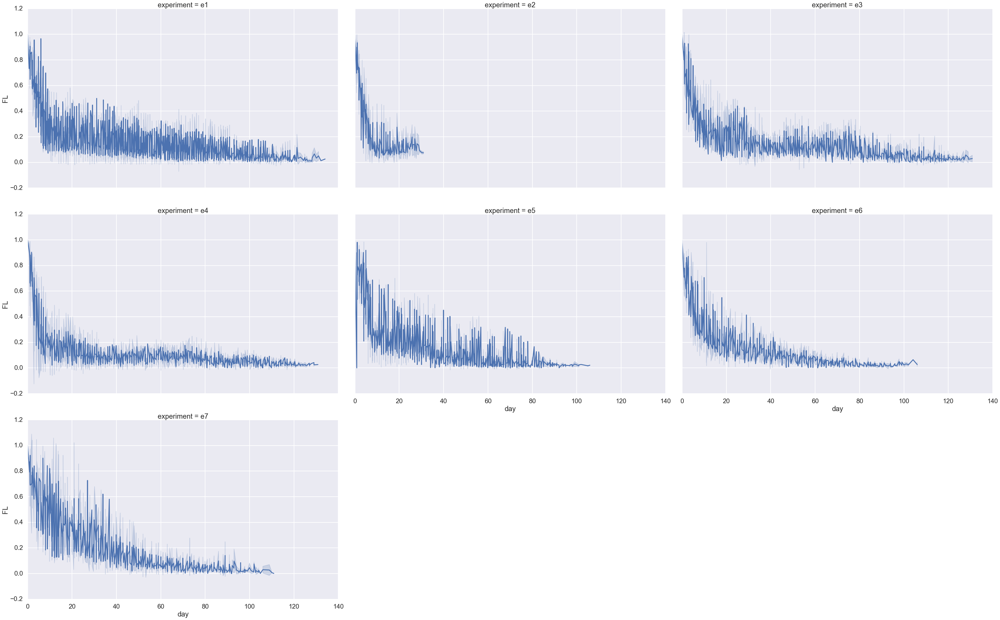

In [365]:
sns.relplot(data=dfd, x='day', y='FL',  kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

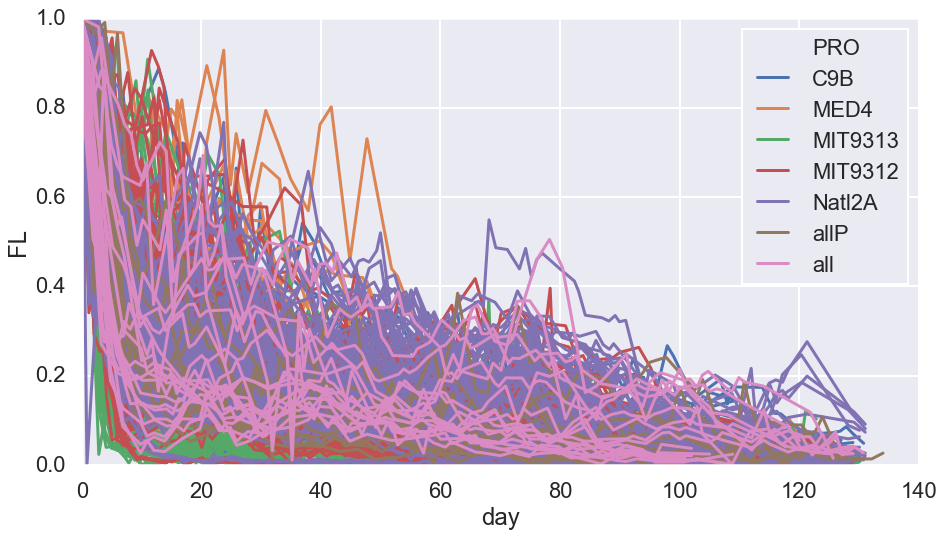

In [374]:
sns.lineplot(data=dfd, x='day', y='FL',    units='experiment_sample', estimator=None, hue='PRO', dashes='experiment')

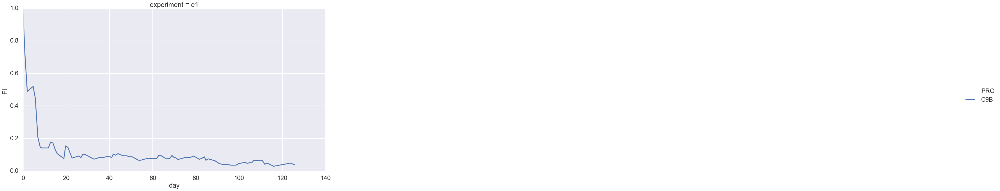

In [364]:
sns.relplot(data=dfd.loc[dfd.experiment_sample == 'e1, 10A'], x='day', y='FL', hue='PRO', kind='line', ci='sd', height=10, aspect=1.6, col='experiment', col_wrap=3)

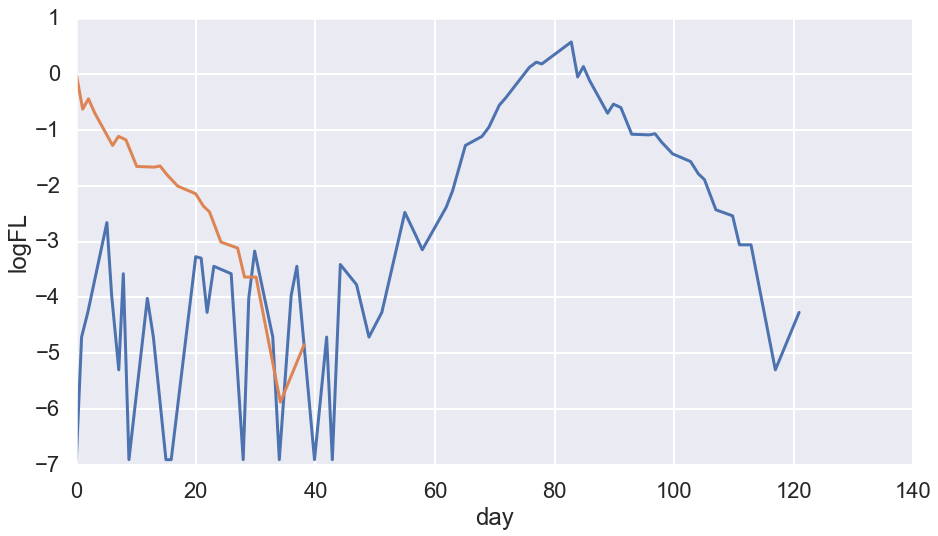

In [390]:
esample = 'e1, 11B'
esample = 'e7, 9C'
esample = 'e1, 36B'
esample = 'e5, 1C'
sns.lineplot(data=df.loc[df.experiment_sample == esample], x=x_col, y='logFL')
sns.lineplot(data=dfd.loc[dfd.experiment_sample == esample], x=x_col, y='logFL')


In [384]:
max_day = dfd.loc[dfd.experiment != 'e2'].groupby('experiment_sample')['day'].max()

experiment_sample
e5, 1C     38.11
e5, 11C    43.04
e5, 21B    49.12
e6, 17A    53.06
e5, 16B    55.82
e6, 7C     64.06
e5, 13B    65.95
e5, 11B    65.95
e6, 7A     67.18
e5, 6B     69.80
e6, 8B     71.02
e5, 23A    71.95
e5, 23C    71.95
e5, 9A     71.95
e5, 8A     71.95
e5, 20C    71.95
e5, 20B    74.03
e5, 4C     74.03
e5, 11A    74.03
e5, 3B     74.03
e5, 6C     74.03
e7, 11A    76.08
e6, 17C    76.09
e5, 18C    78.08
e6, 2A     78.15
e6, 2C     78.15
e5, 13C    79.03
e5, 8C     79.03
e5, 21C    81.06
e5, 18B    81.06
Name: day, dtype: float64

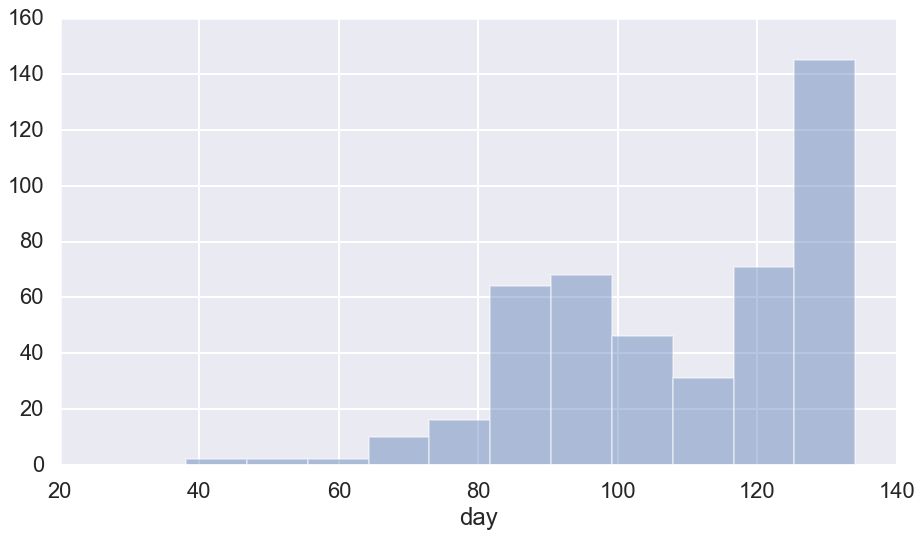

In [391]:
sns.distplot(max_day,kde=False)
max_day.sort_values().head(30)


In [392]:
max_day.shape

(457,)

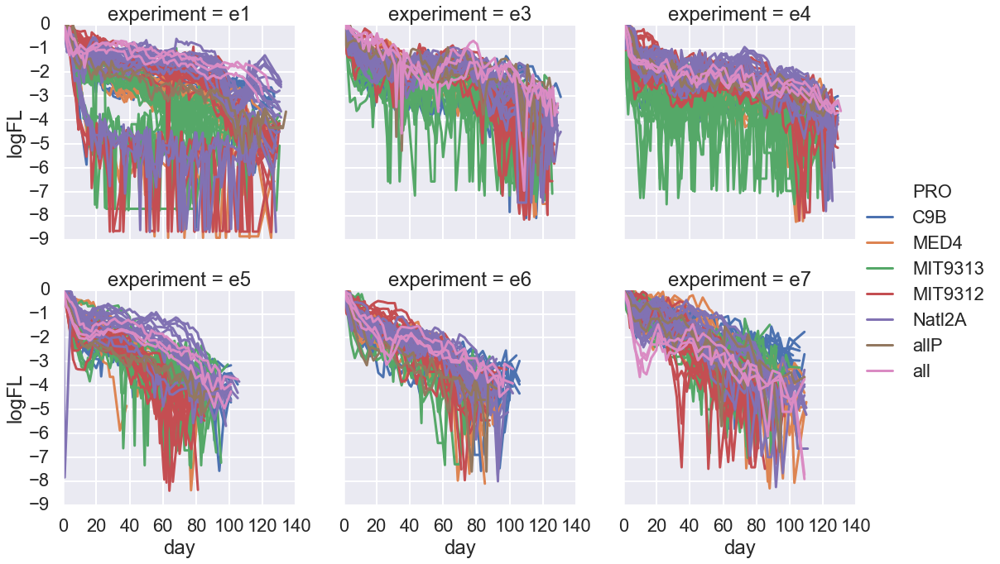

In [401]:
sns.relplot(data=dfd.loc[dfd.experiment != 'e2'], x='day', y='logFL', col='experiment', kind='line', hue='PRO',
             units='experiment_sample', estimator=None, col_wrap=3)

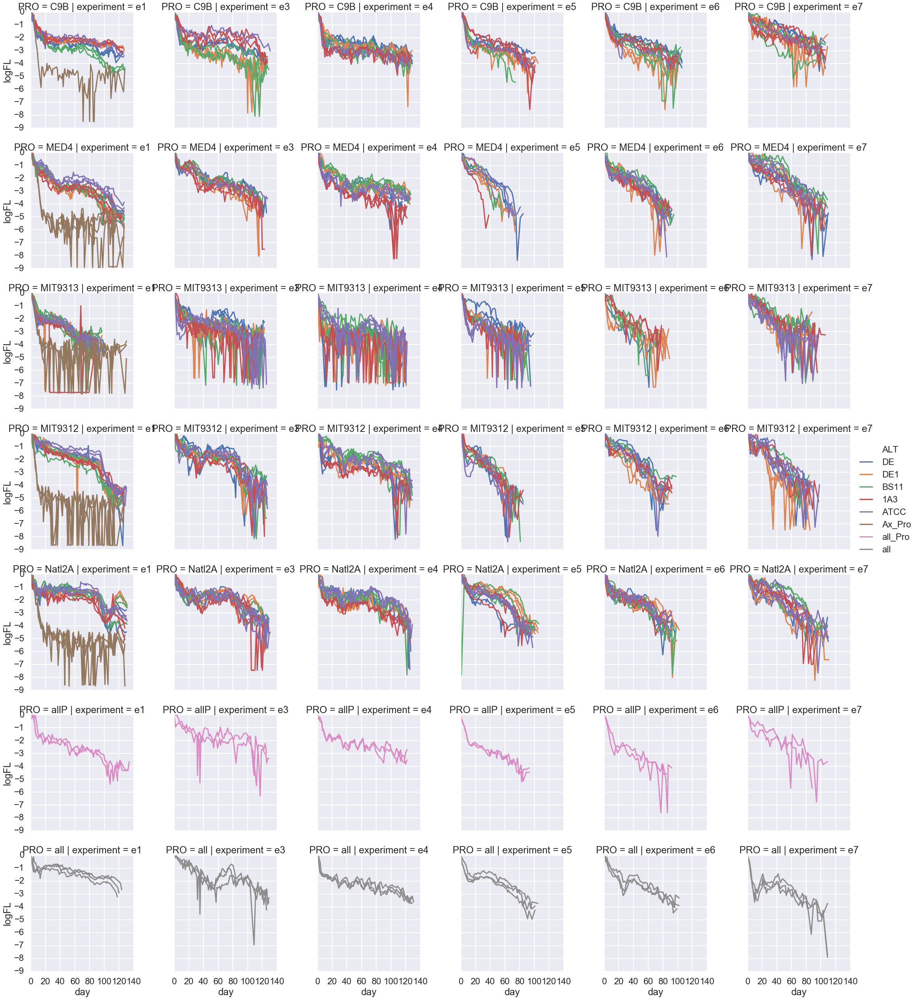

In [410]:
sns.relplot(data=dfd.loc[dfd.experiment != 'e2'], x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

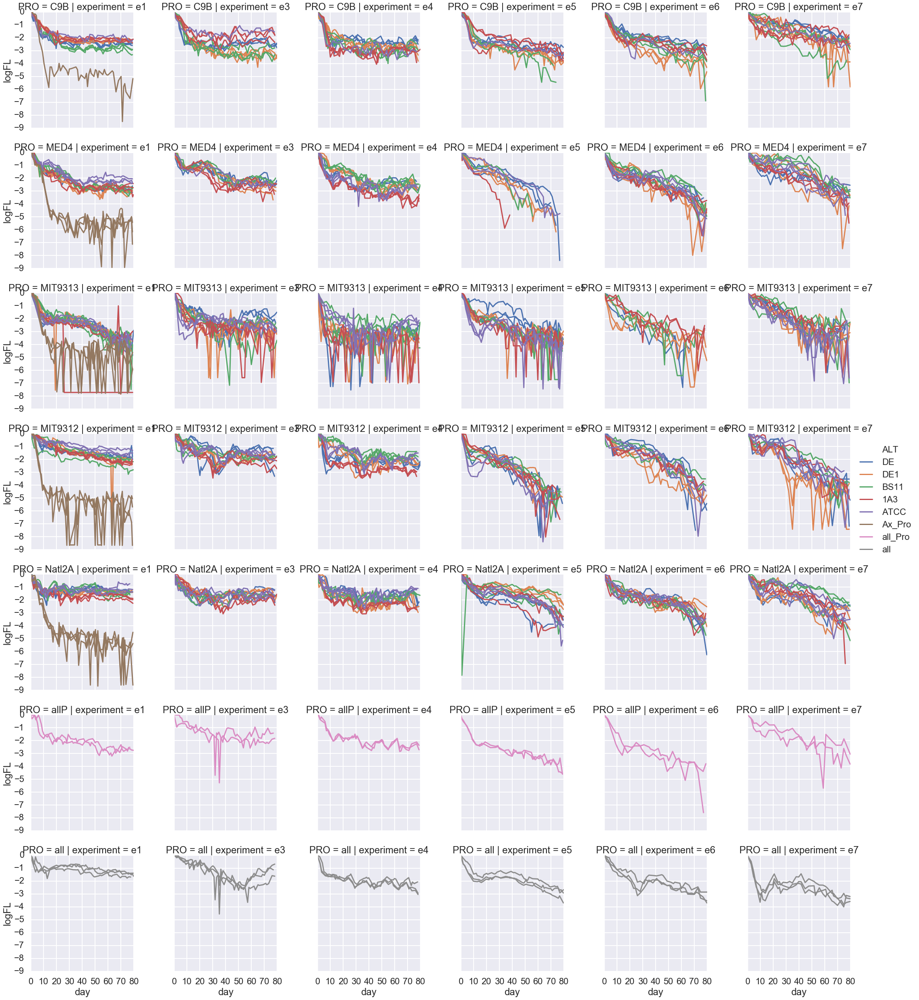

In [413]:
sns.relplot(data=dfd.loc[(dfd.experiment != 'e2') & (dfd.day < 80)], 
            x='day', y='logFL', col='experiment', kind='line', row='PRO',
             units='experiment_sample', estimator=None, hue='ALT'#col_wrap=3
           )

In [411]:
(max_day > 100).sum()

293

In [423]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.82559039 0.10836889]


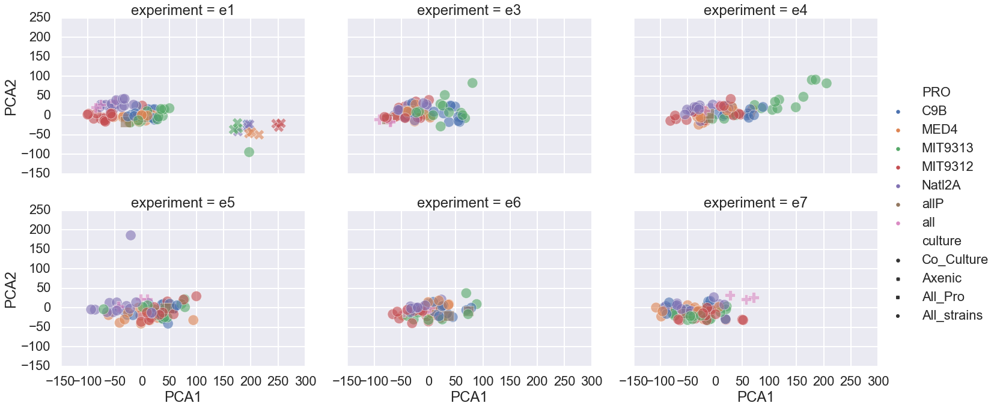

In [430]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

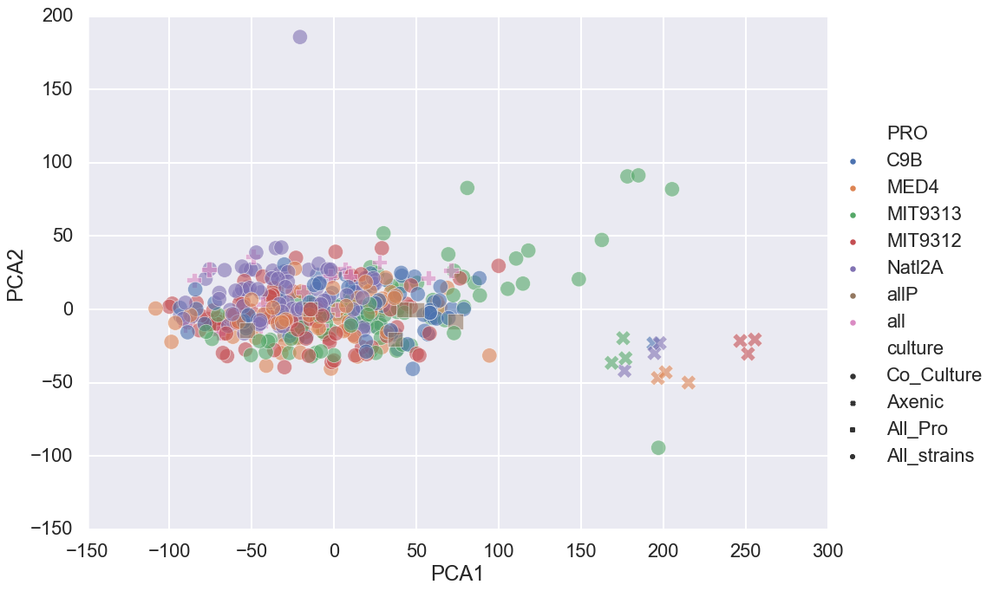

In [431]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

In [432]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(df)
dfpca = cp.run_pca(X=X, metadf=metadf)


Variance percent explained
 [0.53639284 0.14964658]


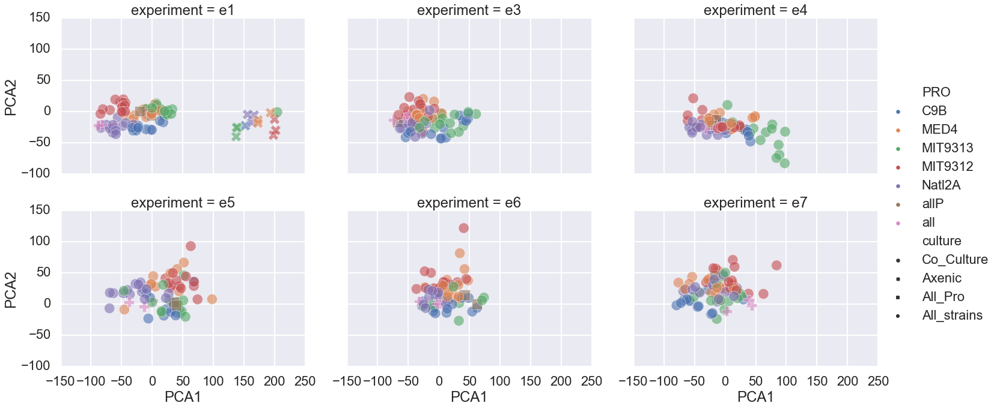

In [433]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=5, alpha=0.6,
            col='experiment', aspect=1.4, col_wrap=3)

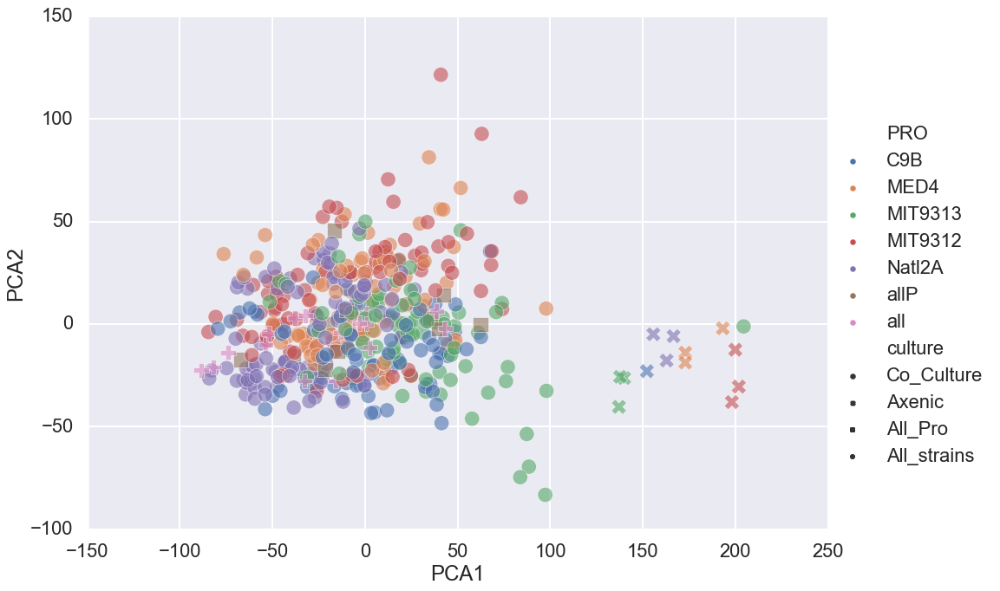

In [434]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=300, height=10, aspect=1.4, alpha=0.6,
           # col='experiment', col_wrap=3
           )

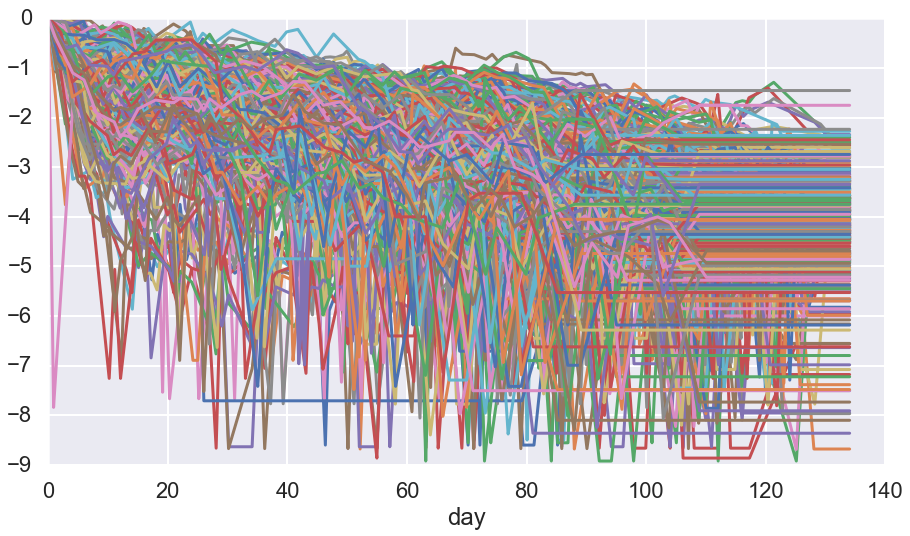

In [436]:
X.T.plot(legend=False)

In [439]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'])
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.4682713347921225


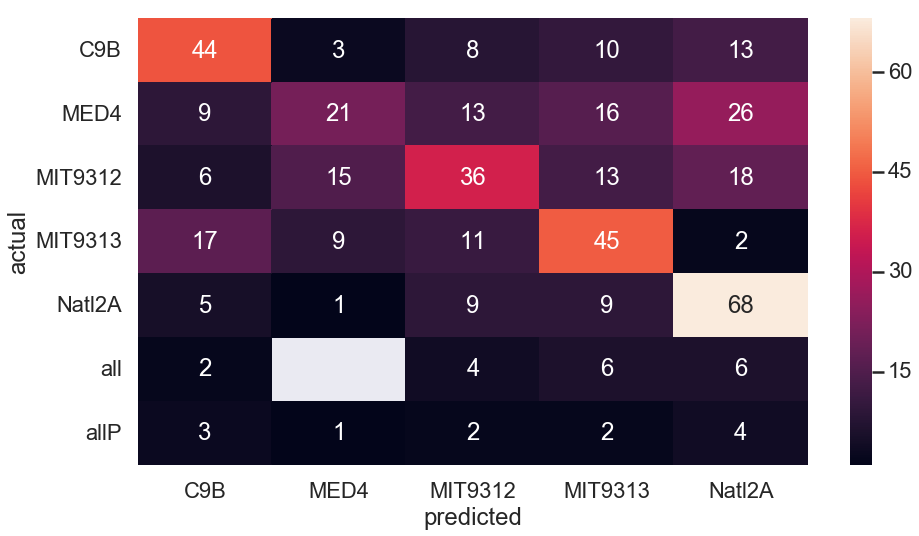

In [440]:
cp.forest_heatmap(clf=clf, X=X, y=y)

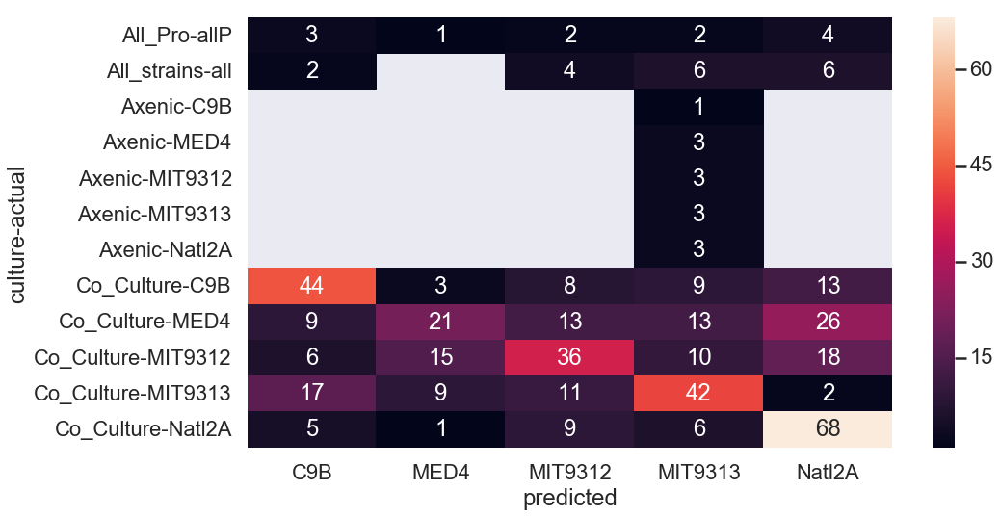

In [441]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

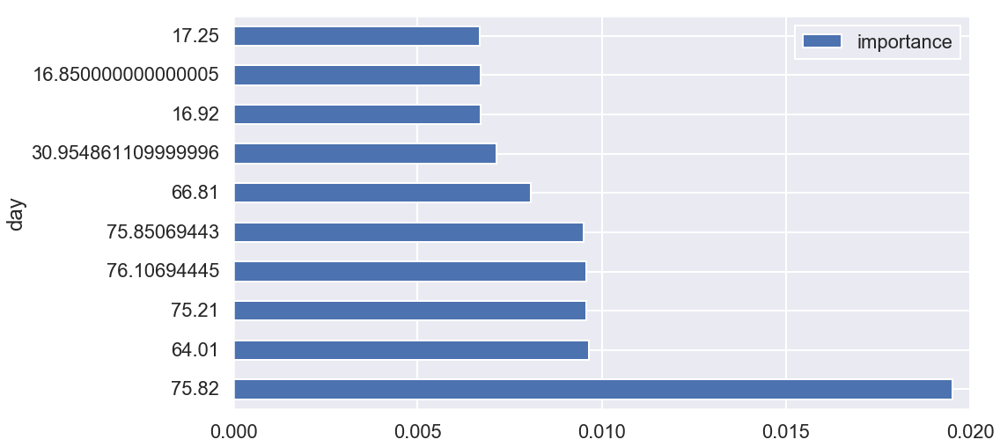

In [442]:
cp.forest_feature_importance(clf=clf, col_names=X.columns)

In [443]:
X = cp.experiments2X(dfd.loc[dfd.experiment != 'e2'], cumsummode=False)
metadf = cp.get_meta(dfd.loc[dfd.experiment != 'e2'])
y = metadf['PRO']
clf = cp.forest_classifier(X=X, y=y)

0.5382932166301969


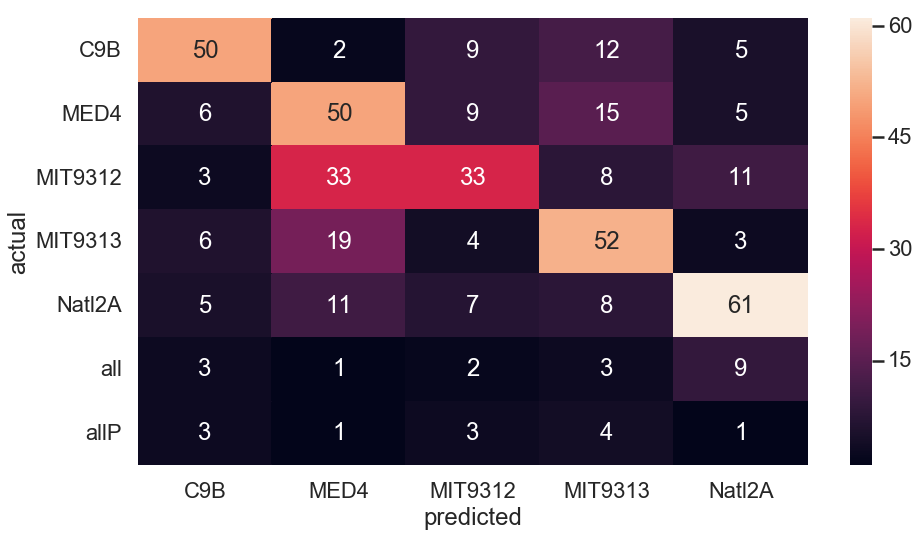

In [444]:
cp.forest_heatmap(clf=clf, X=X, y=y)

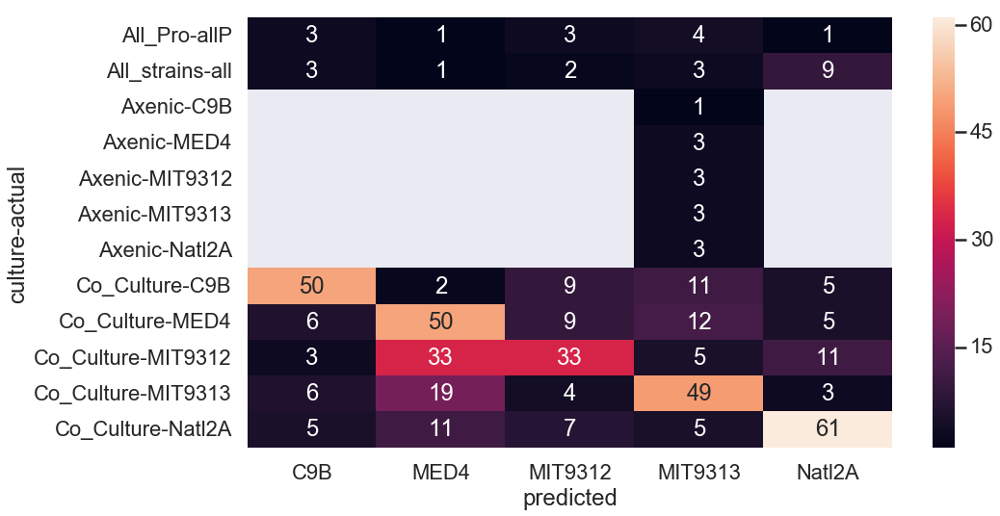

In [445]:
cp.forest_heatmap(clf, X, y, metadf=metadf, breakdown='culture')

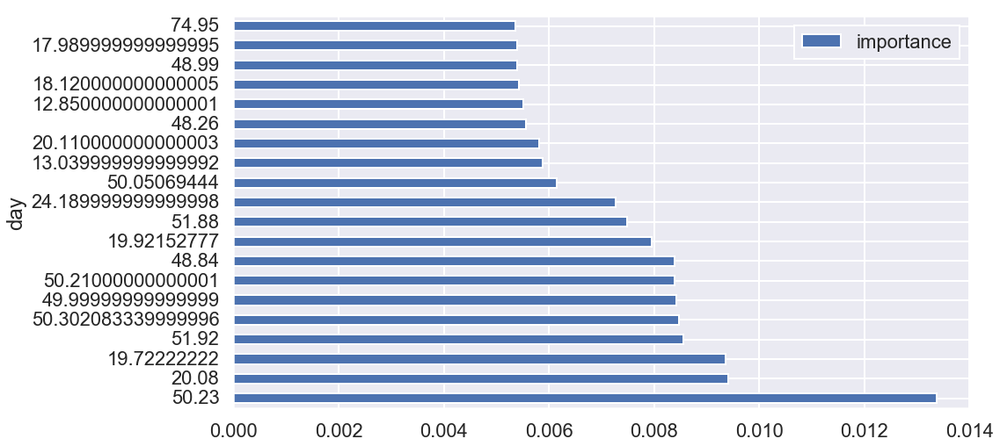

In [448]:
cp.forest_feature_importance(clf=clf, col_names=X.columns, n=20)

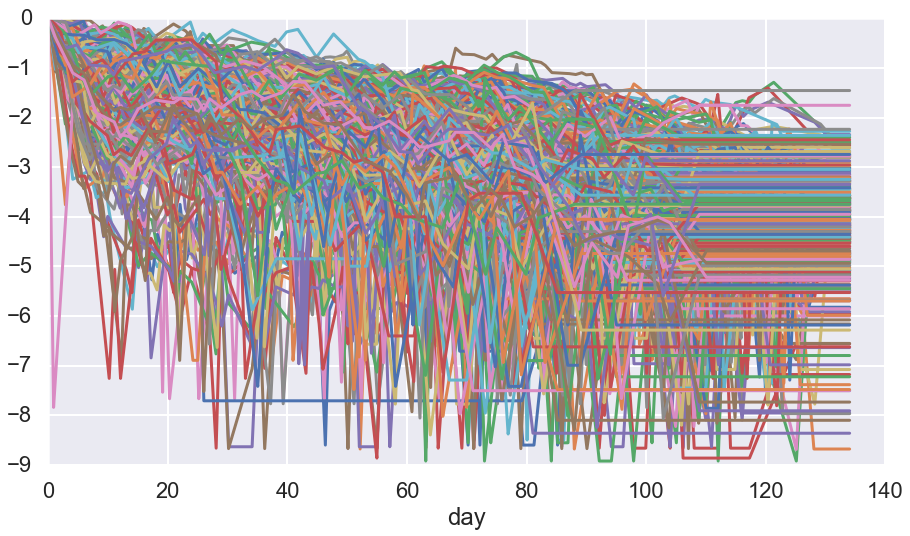

In [449]:
X.T.plot(legend=False)

In [451]:
gdecay = cp.generate_features(df=dfd.loc[dfd.experiment!= 'e2'])